## Imports


In [42]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandapower as pp
import seaborn as sns
import pandas as pd


## Levantar los datos

In [43]:
# Levantar red
net = pp.from_pickle("./red_uru.p")

# Levantar data
data_path = "reduru_sintetica" # "reduru"
input_path = f'./{data_path}/train/input.npy'
vm_path = f'./{data_path}/train/vm_pu_opt.npy'
q_shunt_path = f'./{data_path}/train/q_switch_shunt_opt.npy'


x = np.load(input_path)
vm = np.load(vm_path).squeeze()
q_shunt =  np.load(q_shunt_path).squeeze()


print("Tenemos {} muestras".format(x.shape[0]))


# Función que mapea indice de bus a posición
bus_map = {net.bus.index[i]: i for i in range(len(net.bus))}
def bus_pos(buses):
    try:
        return [bus_map[bus] for bus in buses]
    except:
        return bus_map[buses]

Tenemos 77 muestras


## Metadata Red
 


In [39]:
idx_gen = bus_pos(net.gen.bus.values)
idx_shunt = bus_pos(net.sgen.bus[net.sgen.controllable==True].values)
idx_load = bus_pos(net.load.bus.values)
idx_ext_grid = bus_pos(net.ext_grid.bus.values)
idx_sgen = bus_pos(net.sgen.bus[net.sgen.controllable==False].values)
print(f"La red tiene {len(net.bus)} buses")
print(f"La red tiene {len(net.line)} lineas")
print(f"La red tiene {len(net.ext_grid)} barras de referencia")
print(f"La red tiene {len(net.gen)} generadores")
print(f"La red tiene {len(net.load)} cargas")
print(f"La red tiene {len(net.sgen)} generadores estaticos")

print(f"La red tiene {len(net.shunt)} shunts")
print(f"La red tiene {len(net.trafo)} trafos")
print(f"La red tiene {len(net.switch)} switches")

La red tiene 107 buses
La red tiene 144 lineas
La red tiene 1 barras de referencia
La red tiene 15 generadores
La red tiene 55 cargas
La red tiene 27 generadores estaticos
La red tiene 6 shunts
La red tiene 12 trafos
La red tiene 0 switches


## Grafica Entradas

### Carga Activa

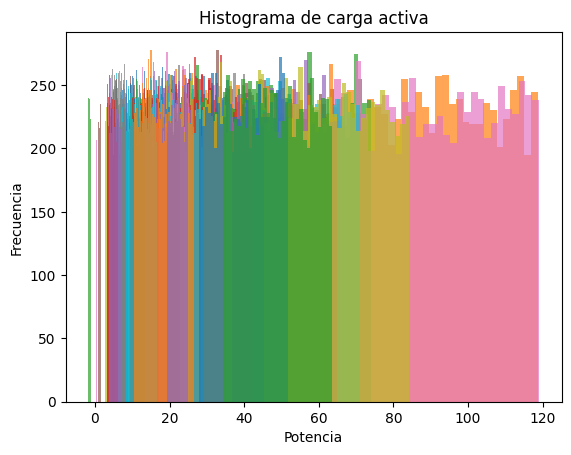

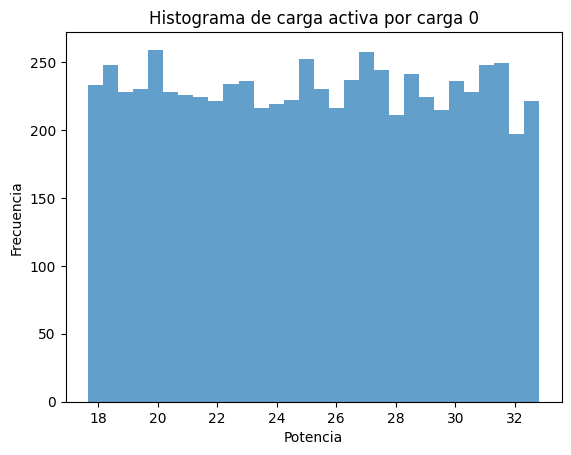

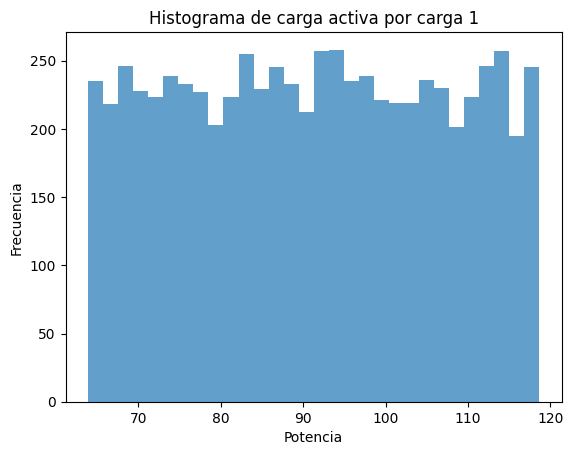

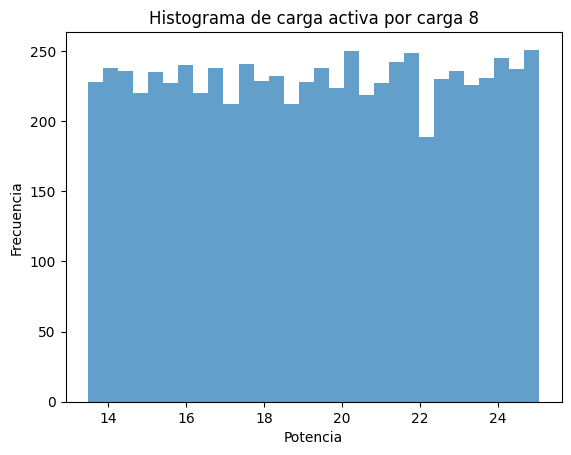

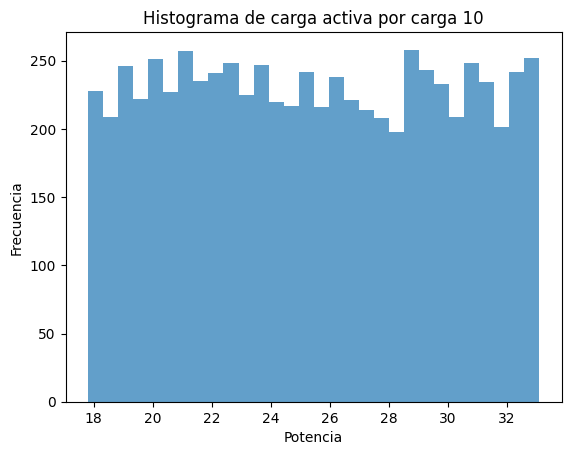

...

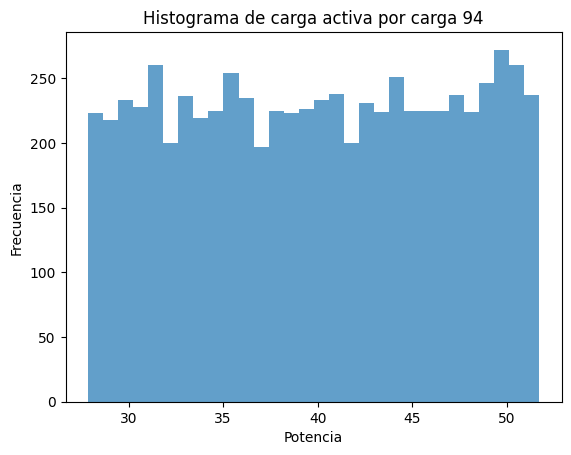

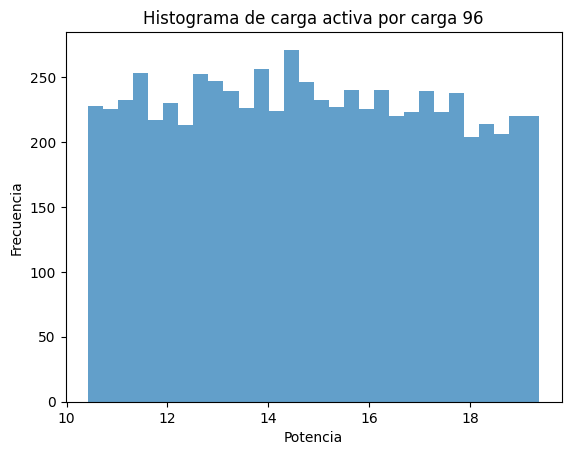

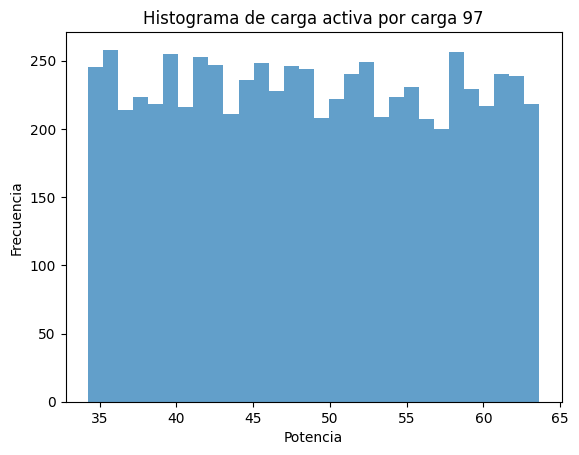

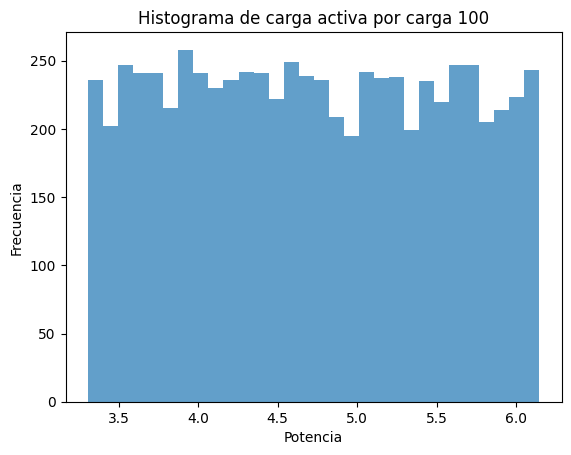

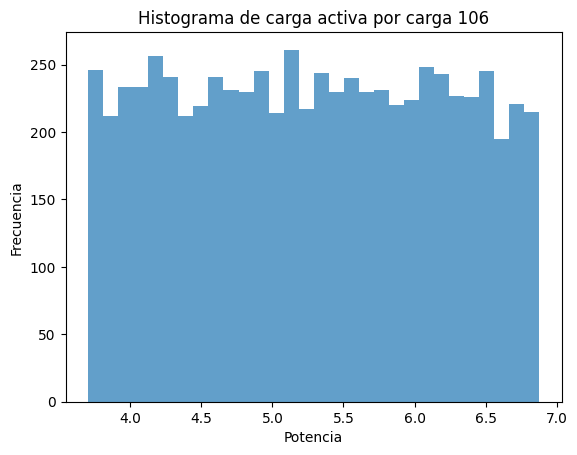

In [29]:
for i in idx_load:
    plt.hist(x[:, i, 0], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga activa')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
plt.show()


for i in idx_load:
    plt.hist(x[:, i, 0], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga activa por carga {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    plt.show()

### Carga Reactiva

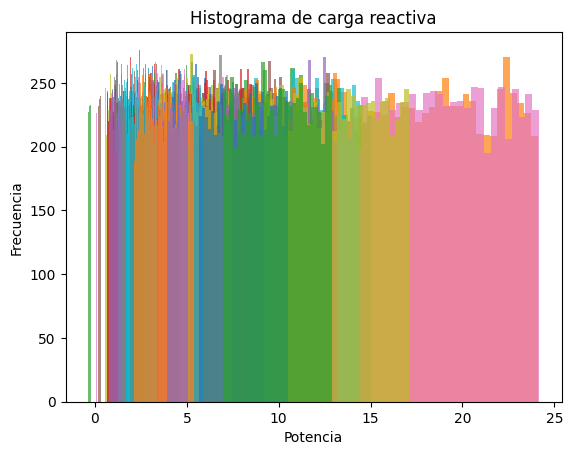

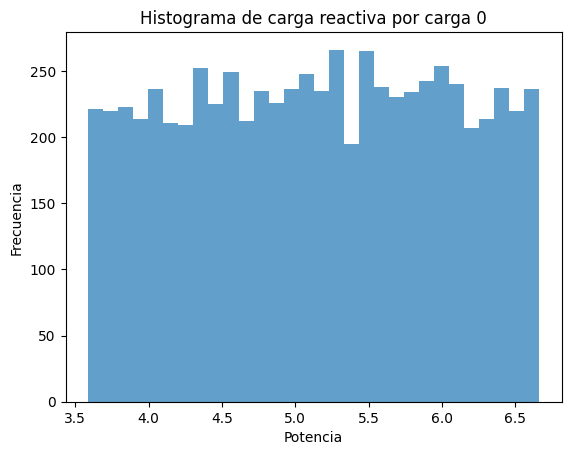

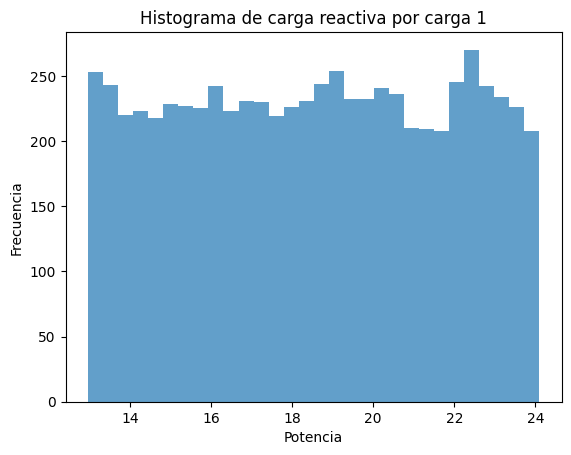

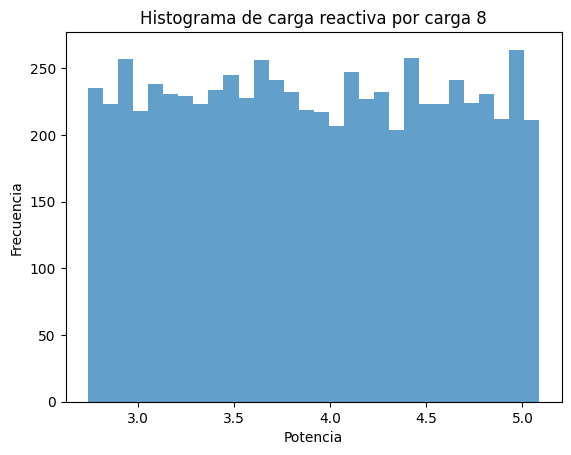

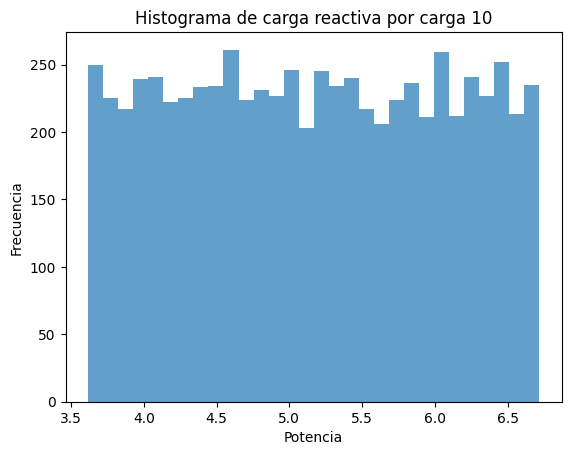

...

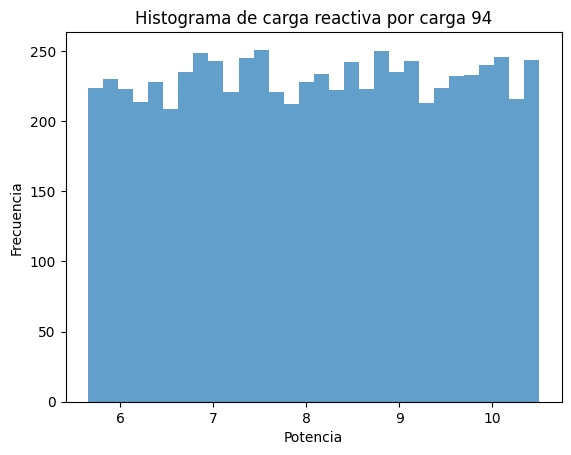

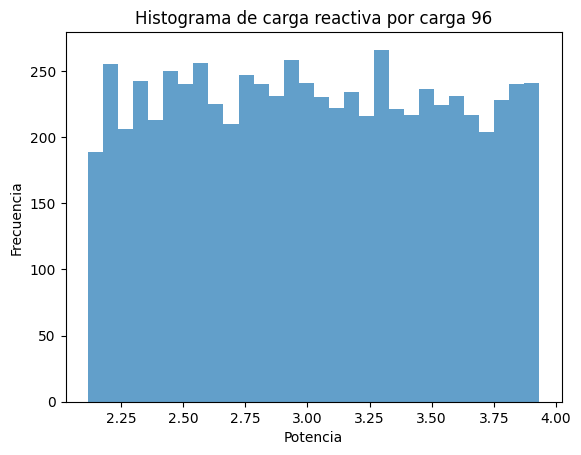

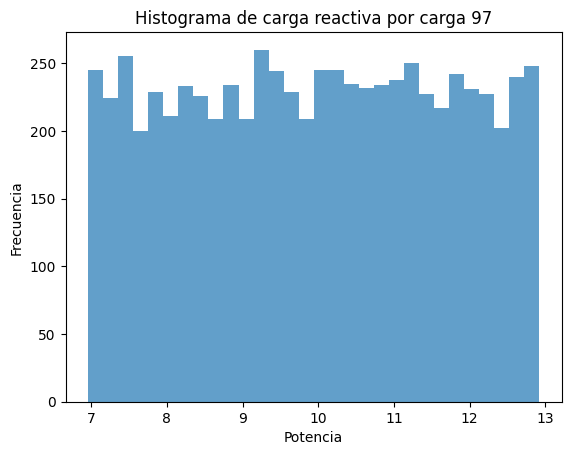

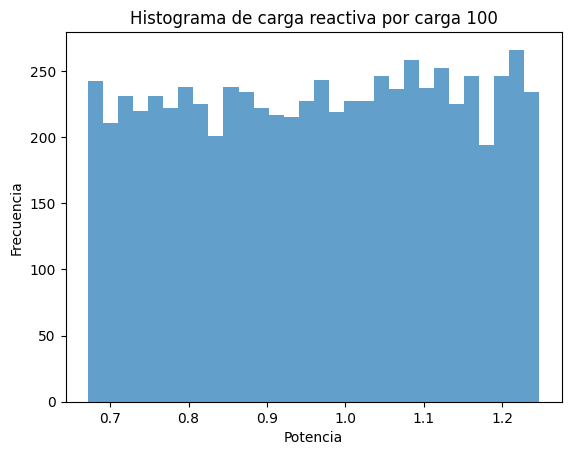

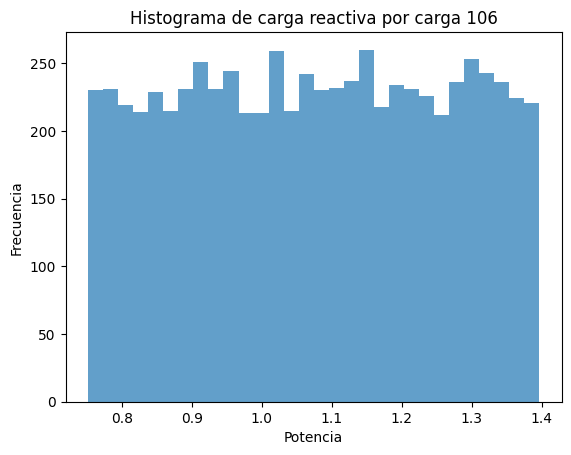

In [30]:
for i in idx_load:
    plt.hist(x[:, i, 1], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga reactiva')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_load:
    plt.hist(x[:, i, 1], bins=30,alpha=0.7) 
    plt.title(f'Histograma de carga reactiva por carga {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()

### Generacion Activa Gens

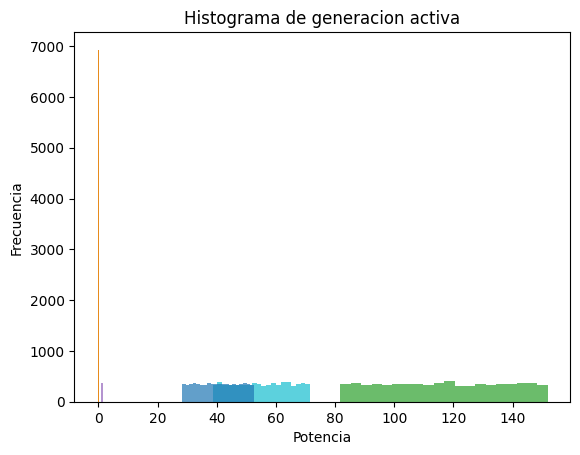

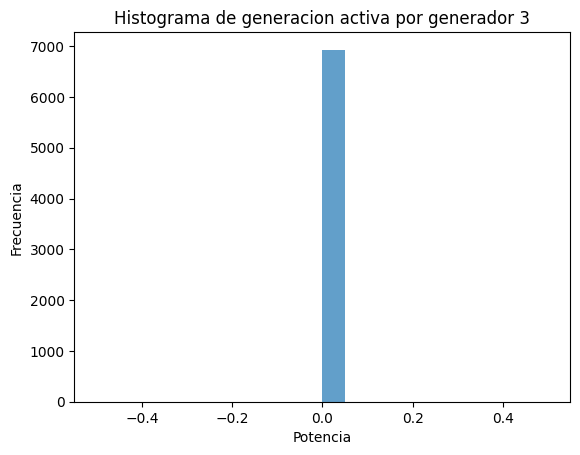

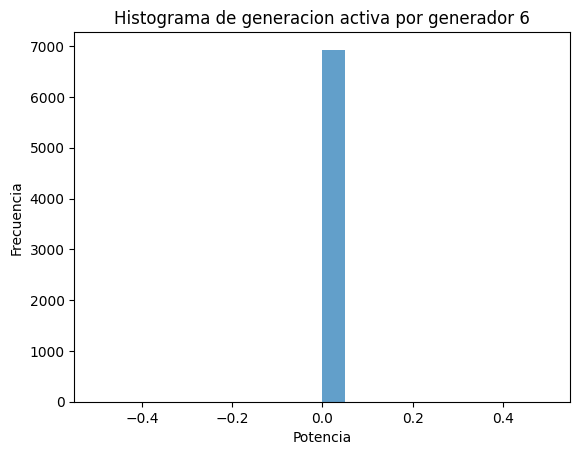

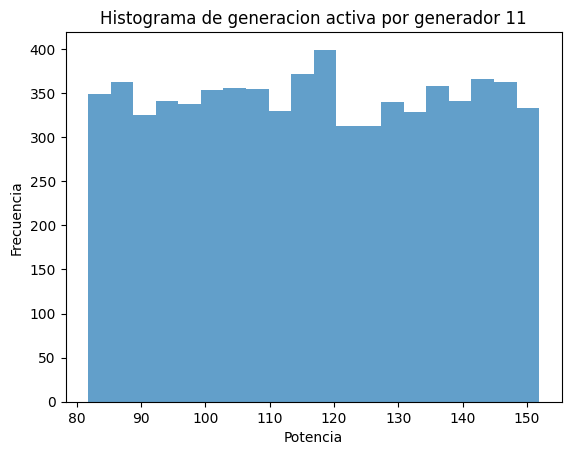

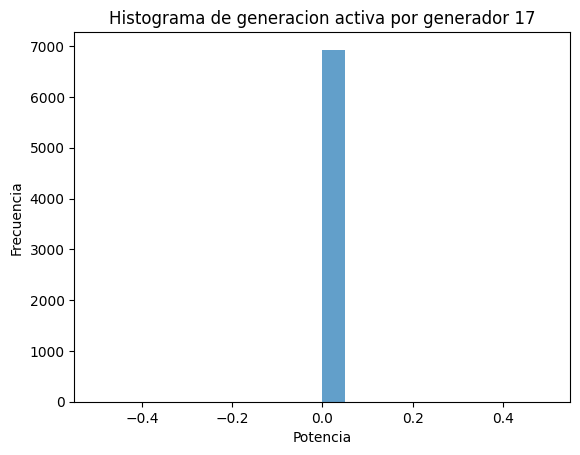

...

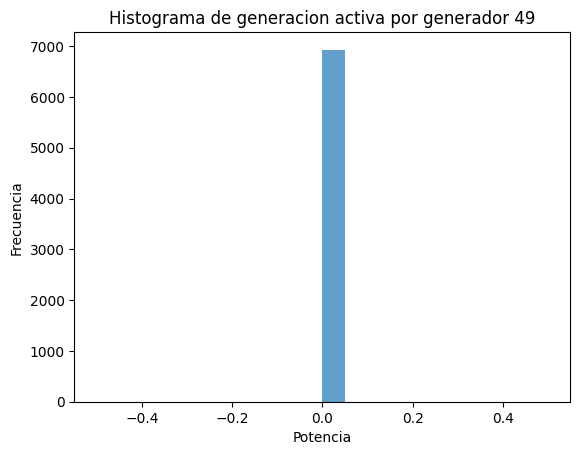

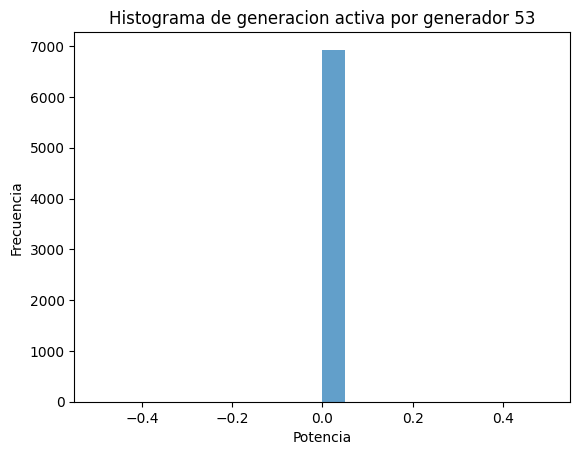

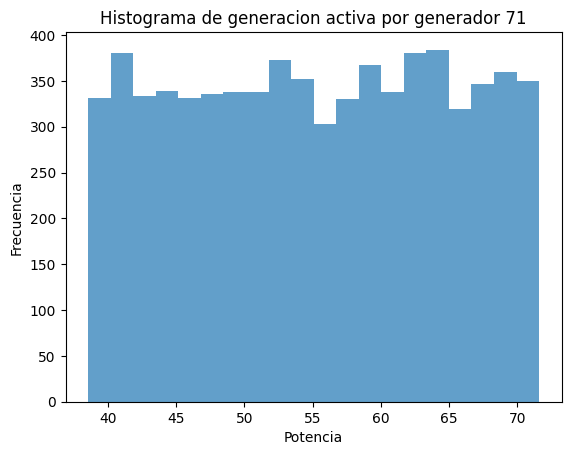

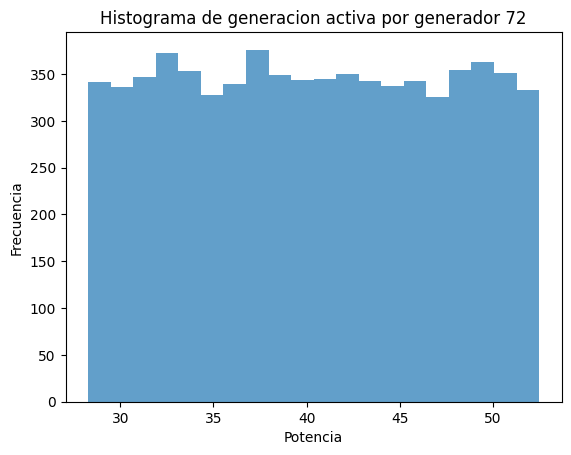

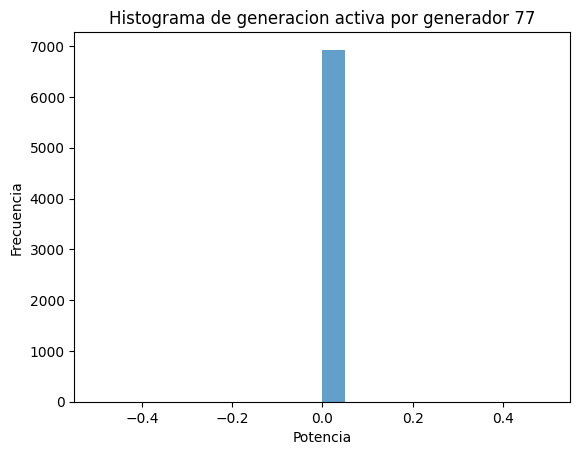

In [31]:
for i in idx_gen:
    plt.hist(x[:, i, 2], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion activa')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_gen:
    plt.hist(x[:, i, 2], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion activa por generador {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()
    


In [37]:
idx_gen

[3, 6, 11, 17, 27, 37, 48, 49, 53, 71, 72, 77]

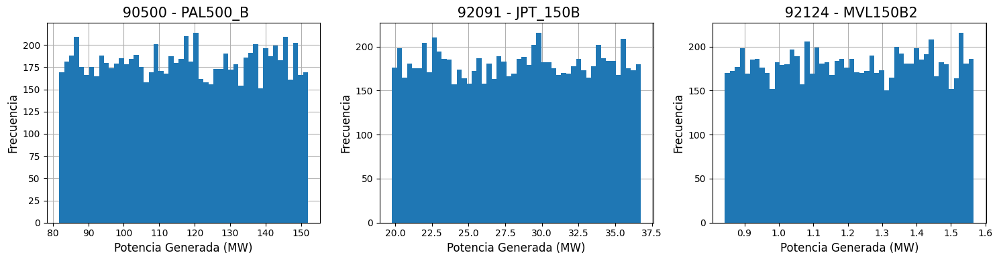

In [27]:
idxs = [0, 1, 2]#, 11, 12, 9, 8, 13, 14]
fig, ax = plt.subplots(1, 3, figsize=(15, 4))  # Crear una cuadrícula de subplots 3x3

for idx, i in enumerate(idx_gen):
    if idx not in idxs:
        continue
    row = idxs.index(idx) // 3
    col = idxs.index(idx) % 3
    ax[idx].hist(x[:, i, 2], bins=50) 
    ax[idx].set_title(f' {net.gen.bus.values[idx]} - {net.bus.loc[net.gen.bus.values[idx]]["name"]}', fontsize=15)
    ax[idx].set_xlabel('Potencia Generada (MW)', fontsize=12)
    ax[idx].set_ylabel('Frecuencia', fontsize=12)
    # ax[idx].set_xlim(0.95, 1.075)
    # ax[idx].set_ylim(0, 12000)
    # ax[idx].set_ylim(0, 3000)
    ax[idx].grid(True)
    #set graph on top of grid
    ax[idx].set_axisbelow(True)
    
plt.tight_layout()  # Ajusta el espaciado para evitar solapamientos
plt.show()
fig.savefig('hist_gen_uru_sintetica.pdf')

### Generacion activa sgens

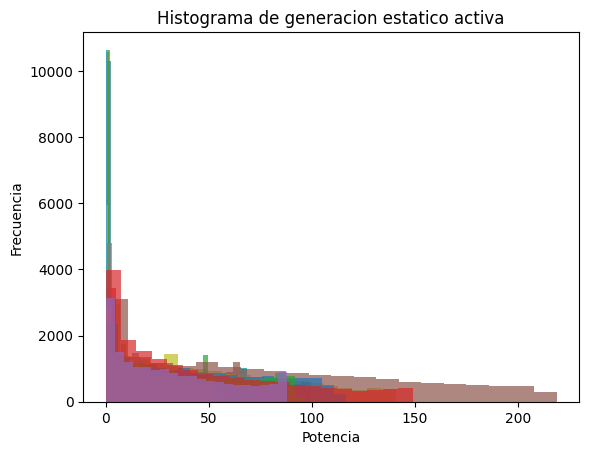

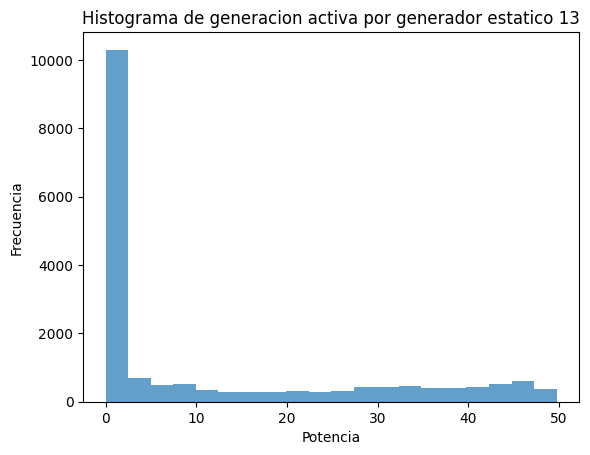

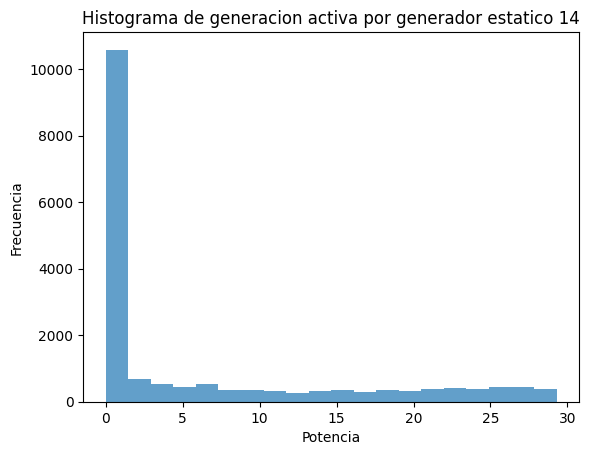

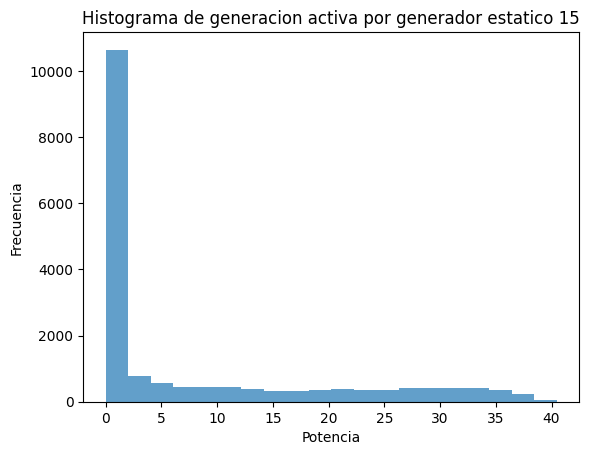

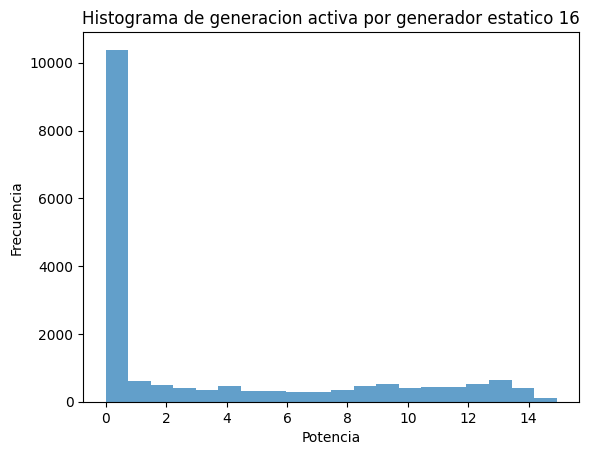

...

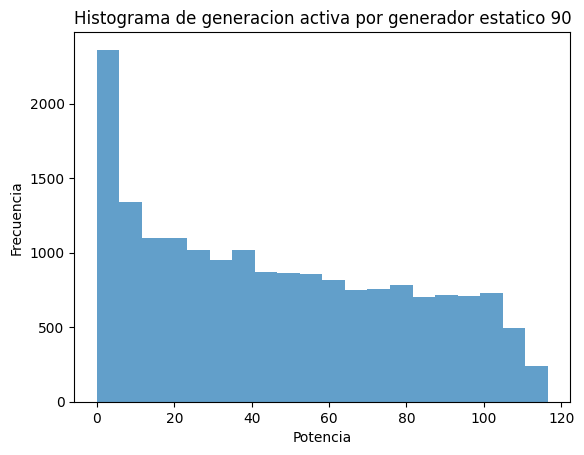

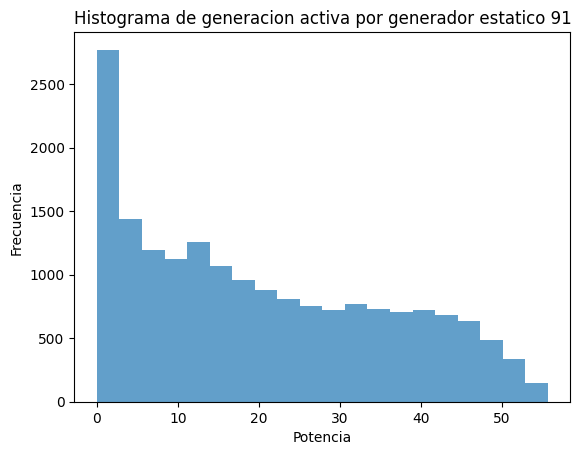

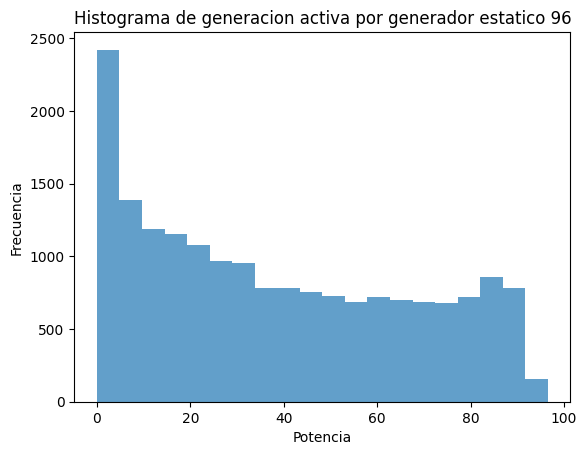

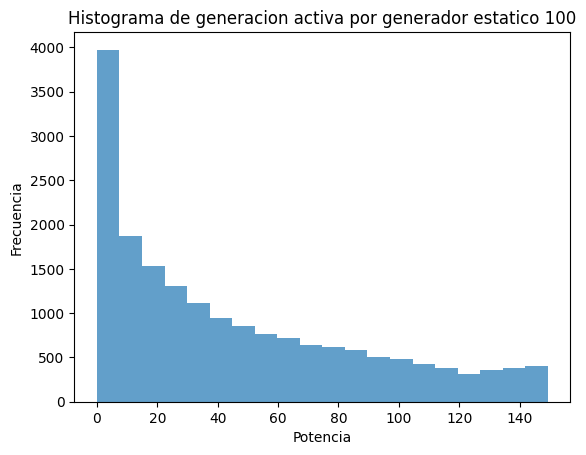

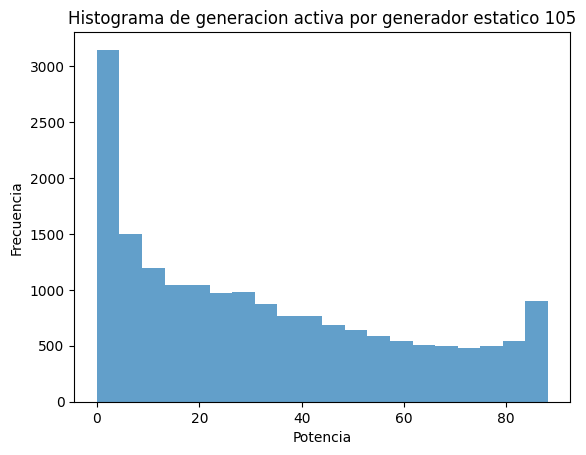

In [8]:
for i in idx_sgen:
    plt.hist(x[:, i, 3], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion estatico activa')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
plt.show()


for i in idx_sgen:
    plt.hist(x[:, i, 3], bins=20,alpha=0.7) 
    plt.title(f'Histograma de generacion activa por generador estatico {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,1200)
    plt.show()

## Grafica Valores optimos

### vm_pu

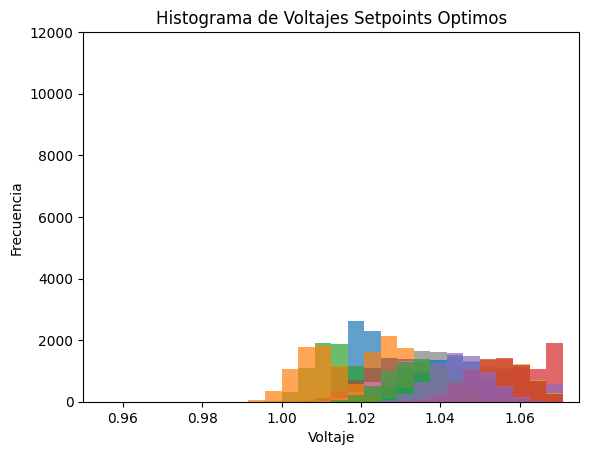

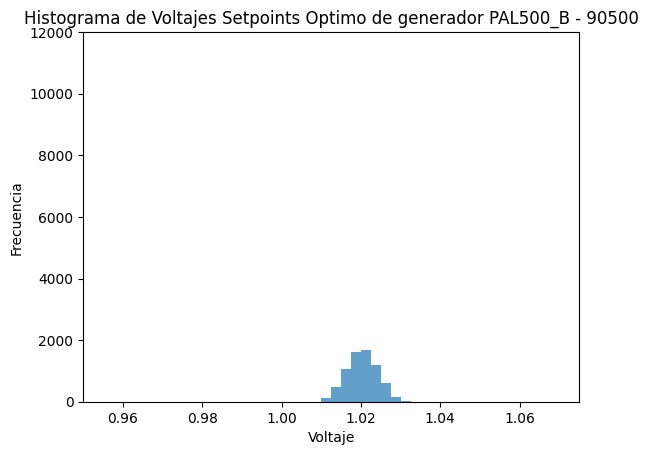

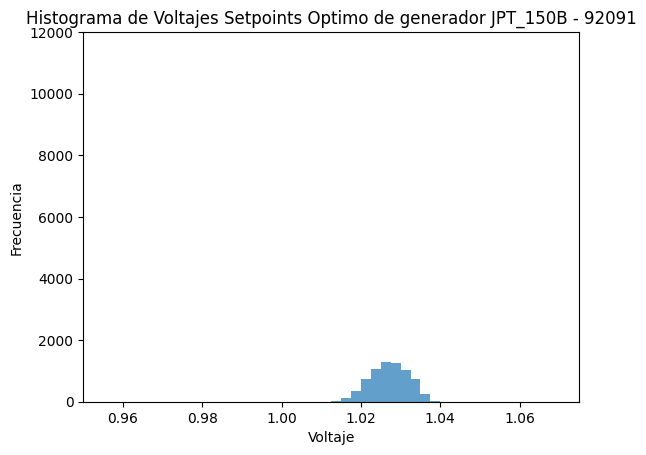

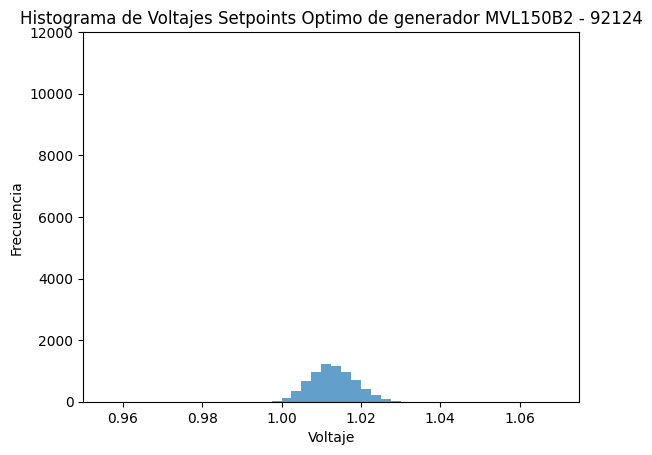

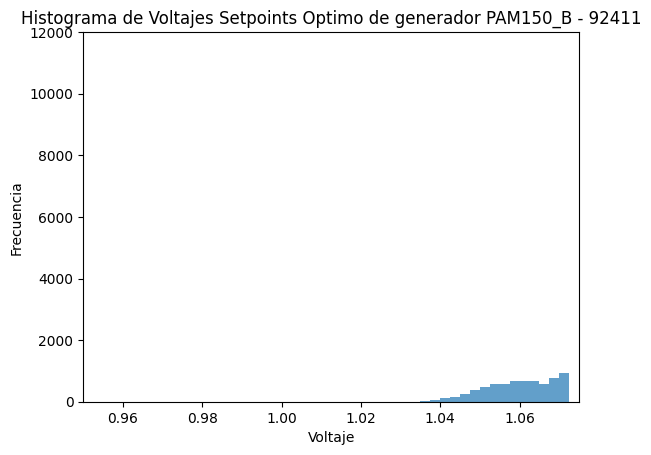

...

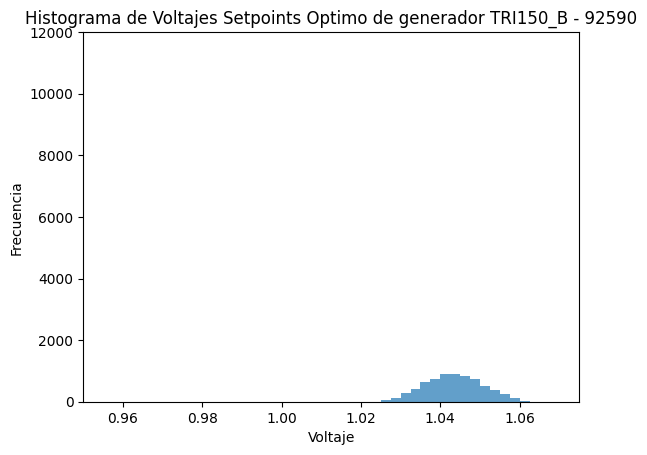

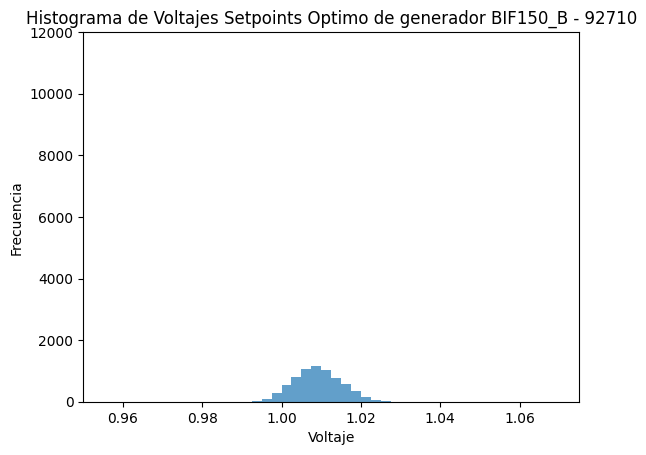

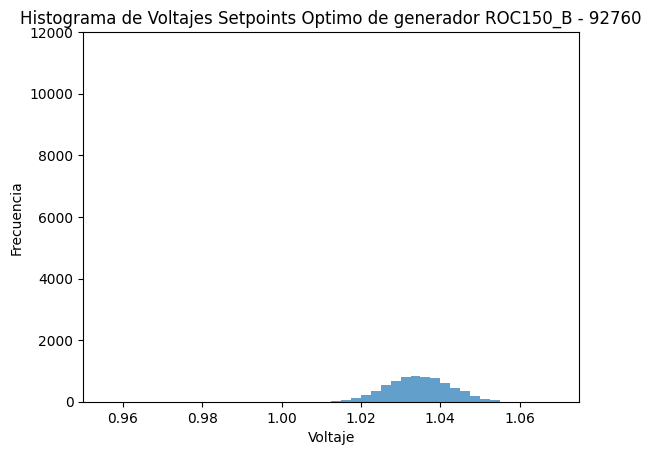

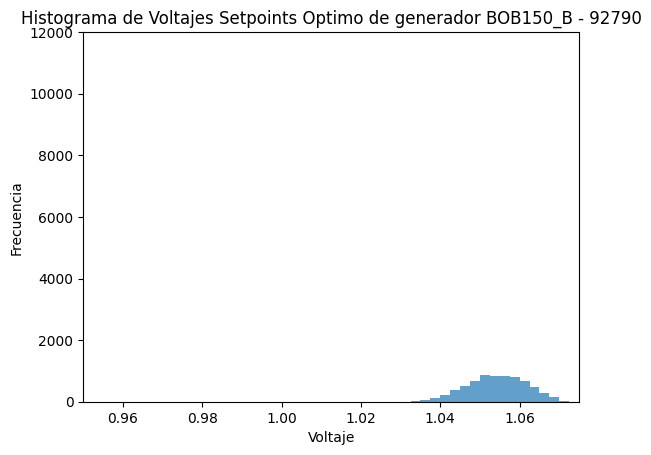

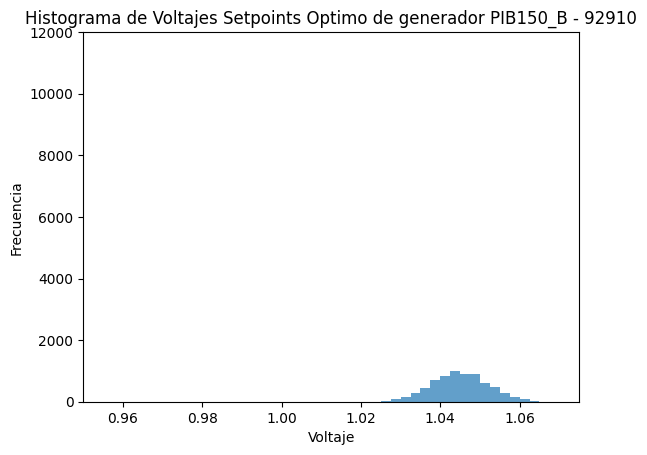

In [40]:

for i in idx_gen:
    plt.hist(vm[:, i], bins=30,alpha=0.7,range=(0.95,1.075)) 
    plt.title(f'Histograma de Voltajes Setpoints Optimos')
    plt.xlabel('Voltaje')
    plt.ylabel('Frecuencia')
    plt.xlim(0.95,1.075)
    plt.ylim(0,12000)
plt.show()


for idx,i in enumerate(idx_gen):
    plt.hist(vm[:, i], bins=50,alpha=0.7, range=(0.95,1.075)) 
    plt.title(f'Histograma de Voltajes Setpoints Optimo de generador {net.bus.loc[net.gen.bus.values[idx]]['name']} - {net.gen.bus.values[idx]}')
    plt.xlabel('Voltaje')
    plt.ylabel('Frecuencia')
    plt.xlim(0.95,1.075)
    plt.ylim(0,12000)
    plt.show()

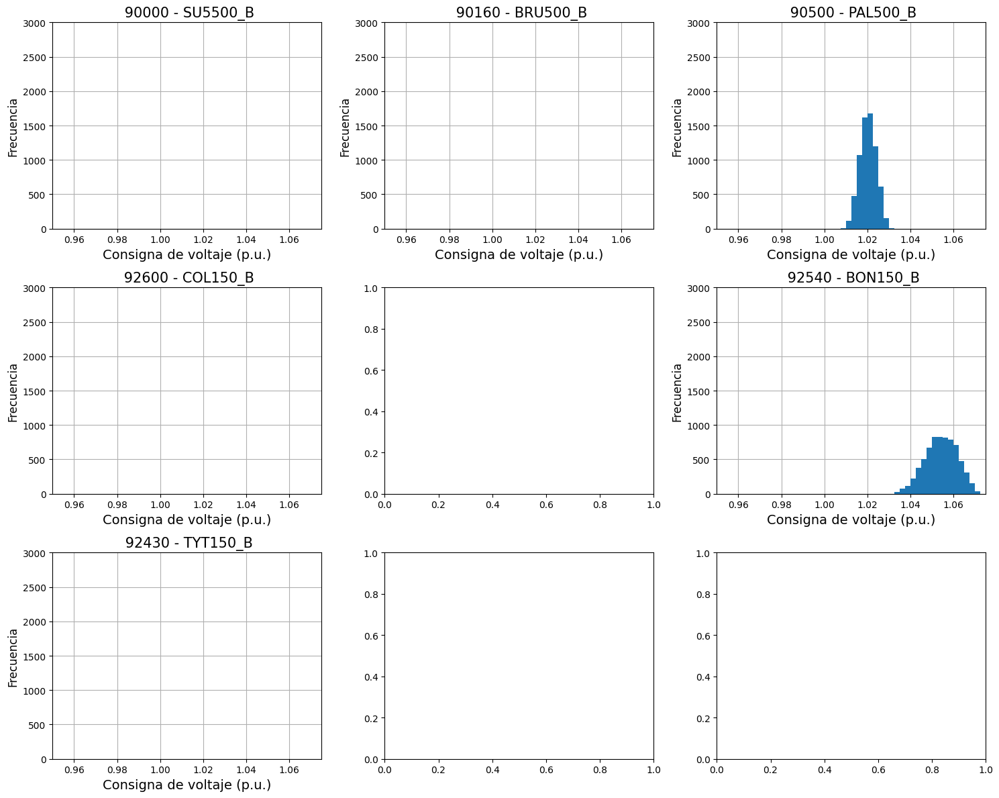

In [15]:
idxs = [0, 1, 2, 11, 12, 9, 8, 13, 14]
fig, ax = plt.subplots(3, 3, figsize=(15, 12))  # Crear una cuadrícula de subplots 3x3

for idx, i in enumerate(idx_gen):
    if idx not in idxs:
        continue
    row = idxs.index(idx) // 3
    col = idxs.index(idx) % 3
    ax[row, col].hist(vm[:, i], bins=50, range=(0.95, 1.075)) 
    ax[row, col].set_title(f' {net.gen.bus.values[idx]} - {net.bus.loc[net.gen.bus.values[idx]]["name"]}', fontsize=15)
    ax[row, col].set_xlabel('Consigna de voltaje (p.u.)', fontsize=14)
    ax[row, col].set_ylabel('Frecuencia', fontsize=12)
    ax[row, col].set_xlim(0.95, 1.075)
    # ax[row, col].set_ylim(0, 12000)
    ax[row, col].set_ylim(0, 3000)
    ax[row, col].grid(True)
    #set graph on top of grid
    ax[row, col].set_axisbelow(True)
    
plt.tight_layout()  # Ajusta el espaciado para evitar solapamientos
plt.show()
fig.savefig('histogramas_voltajes_setpoints_optimos_sintetica.pdf')

### q_shunt


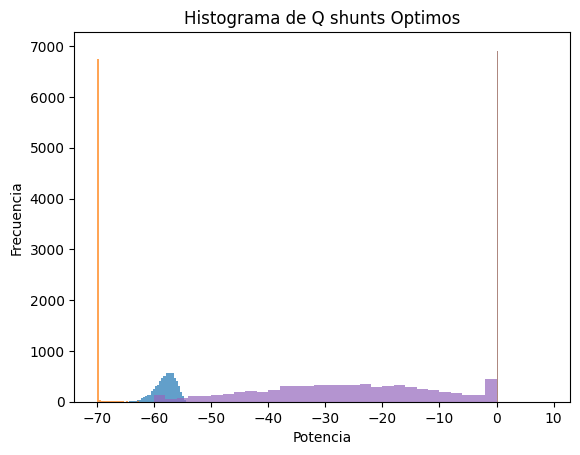

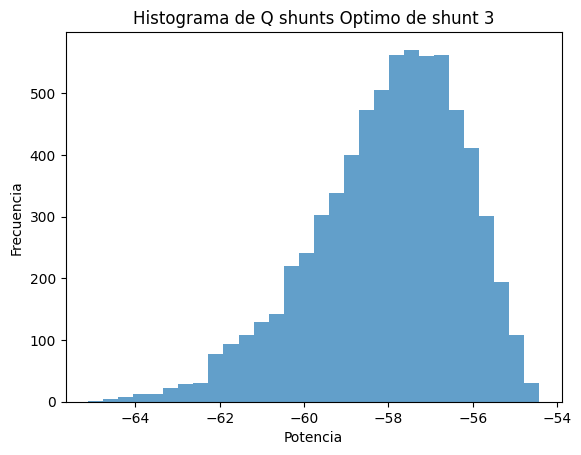

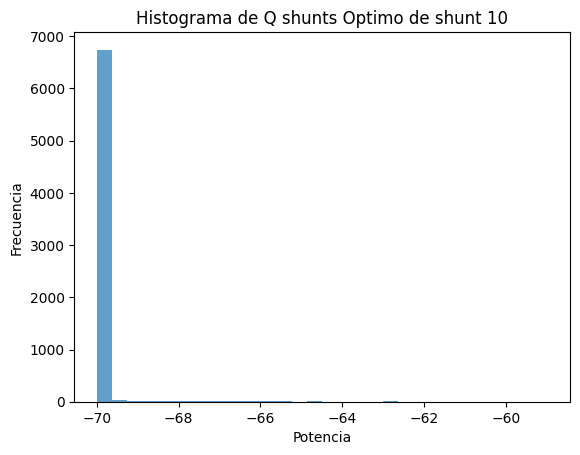

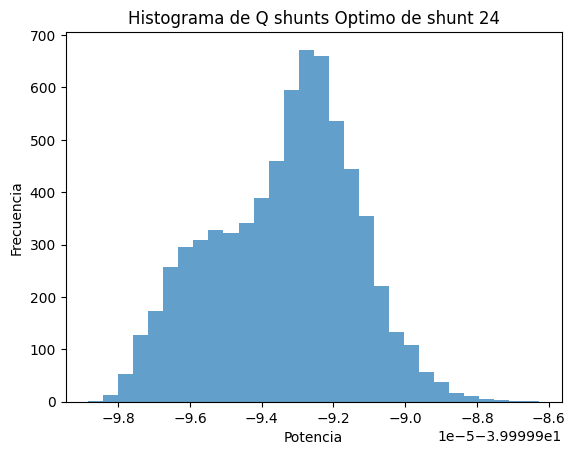

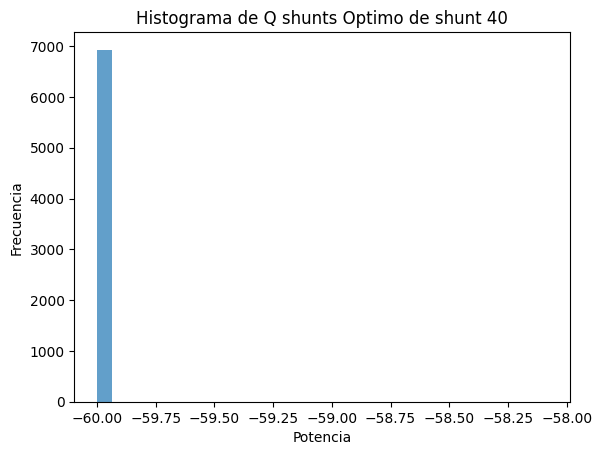

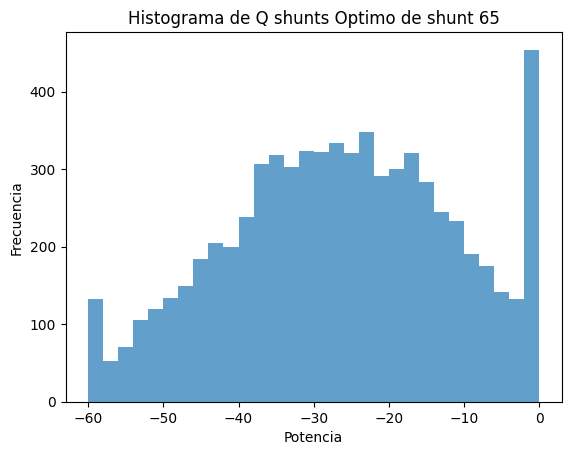

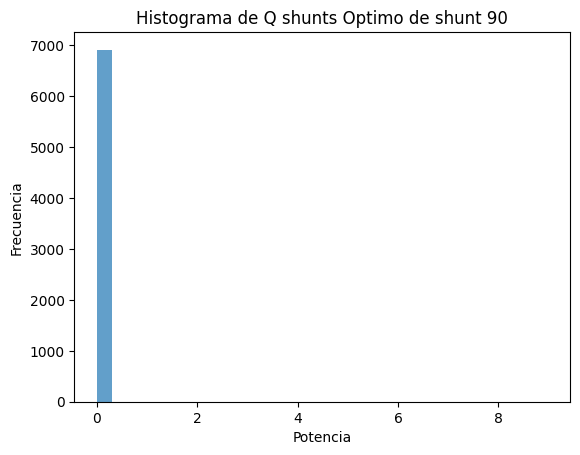

In [41]:
for i in idx_shunt:
    plt.hist(q_shunt[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Q shunts Optimos')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,6000)
plt.show()


for i in idx_shunt:
    plt.hist(q_shunt[:, i], bins=30,alpha=0.7) 
    plt.title(f'Histograma de Q shunts Optimo de shunt {i}')
    plt.xlabel('Potencia')
    plt.ylabel('Frecuencia')
    # plt.xlim(0.89,1.11)
    # plt.ylim(0,6000)
    plt.show()

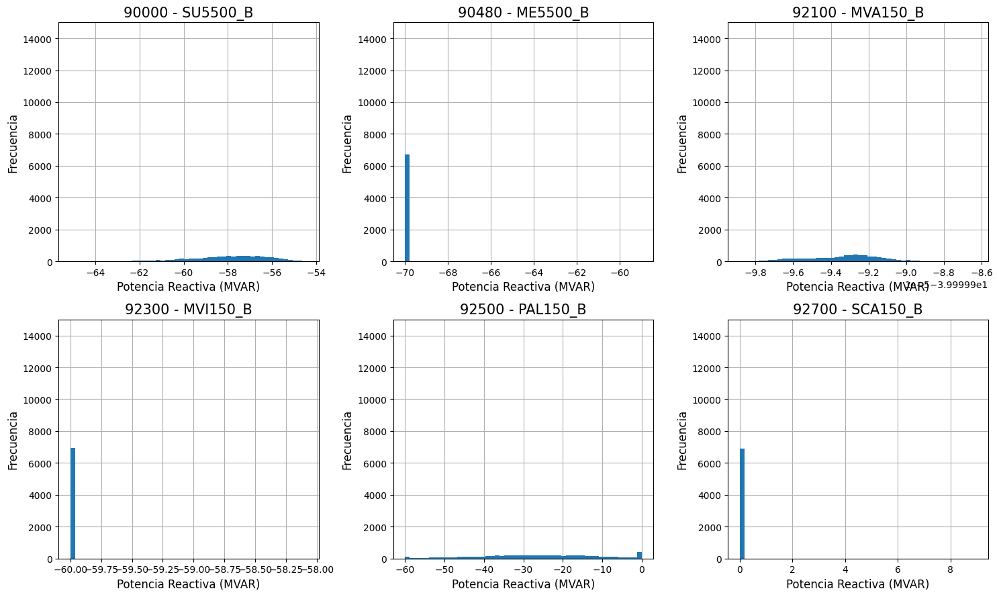

In [18]:
fig, ax = plt.subplots(2, 3, figsize=(15, 9))  # Crear una cuadrícula de subplots 3x3

for idx, i in enumerate(idx_shunt):
    row = idx // 3
    col = idx % 3
    ax[row, col].hist(q_shunt[:, i], bins=50)
    ax[row, col].set_title(f'{net.sgen.bus[net.sgen.controllable==True].values[idx]} - {net.bus.loc[net.sgen.bus[net.sgen.controllable==True].values[idx]]["name"]}', fontsize=15)
    ax[row, col].set_xlabel('Potencia Reactiva (MVAR)', fontsize=12)
    ax[row, col].set_ylabel('Frecuencia', fontsize=12)
    # ax[row, col].set_xlim(0.95, 1.075)
    ax[row, col].set_ylim(0, 15000)
    ax[row, col].grid(True)
    #set graph on top of grid
    ax[row, col].set_axisbelow(True)
    
plt.tight_layout()  # Ajusta el espaciado para evitar solapamientos
plt.show()
# fig.savefig('histogramas_qshunt_optimos.pdf')

## Análisis serie temporal

In [19]:
gen_p = pd.read_csv("./crudo/GENP_total_pandapower.csv")
load_p = pd.read_csv("./crudo/LOADP_total_pandapower.csv")

bus_map = {net.bus.index[i]: i for i in range(len(net.bus))}

### Total sumado

#### Generacion

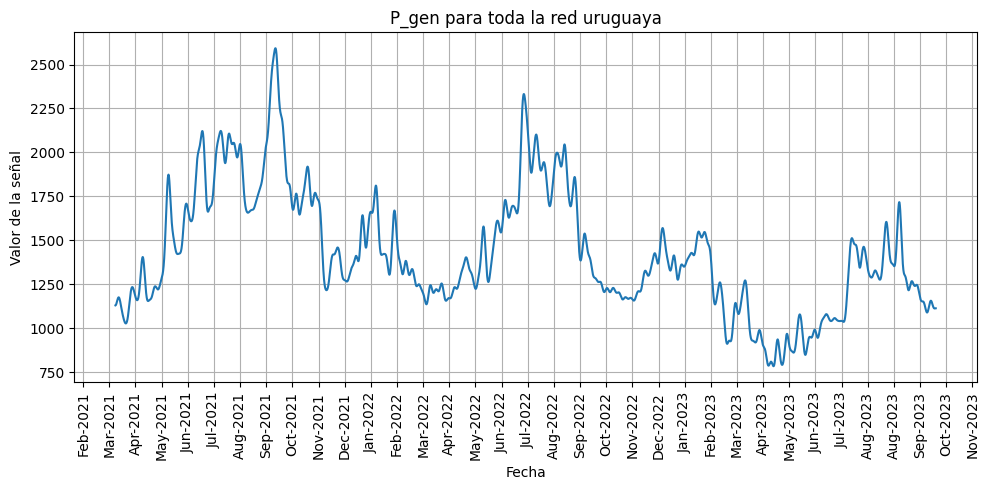

In [20]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

gen_p['Fecha'] = pd.to_datetime(gen_p['Fecha'])
all_gen = np.sum(gen_p[gen_p.columns[1:]],axis=1)

plt.figure(figsize=(10, 5))

all_gen = gaussian_filter1d(all_gen, sigma=50)

plt.plot(gen_p['Fecha'], all_gen)

plt.title(f'P_gen para toda la red uruguaya')
plt.xlabel('Fecha')
plt.ylabel('Valor de la señal')
plt.grid(True)

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))  

plt.xticks(rotation=90)  
plt.tight_layout()  
plt.show()

#### Carga

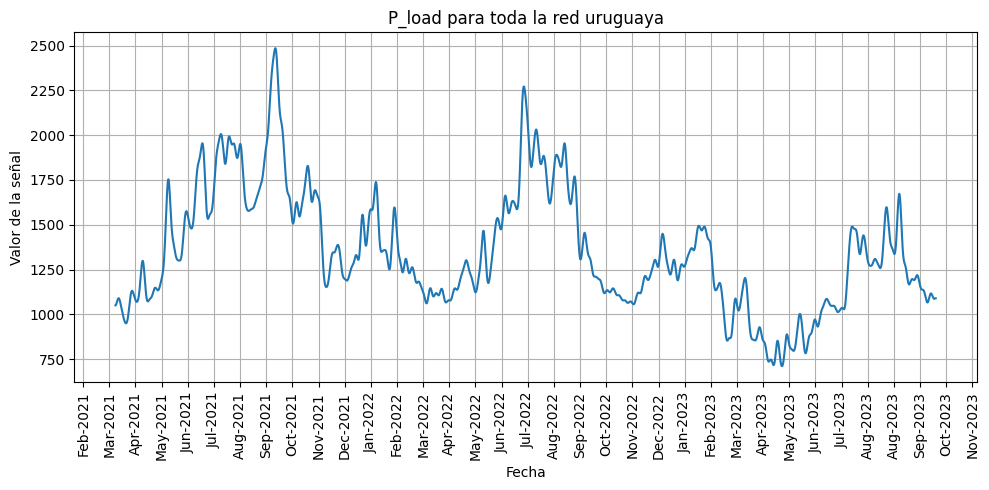

In [21]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

load_p['Fecha'] = pd.to_datetime(load_p['Fecha'])
all_load = np.sum(load_p[load_p.columns[1:]],axis=1)

plt.figure(figsize=(10, 5))

smoothed_signal = gaussian_filter1d(all_load, sigma=50)

plt.plot(load_p['Fecha'], smoothed_signal)

plt.title(f'P_load para toda la red uruguaya')
plt.xlabel('Fecha')
plt.ylabel('Valor de la señal')
plt.grid(True)

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))  

plt.xticks(rotation=90)  
plt.tight_layout()  
plt.show()

#### Ambas

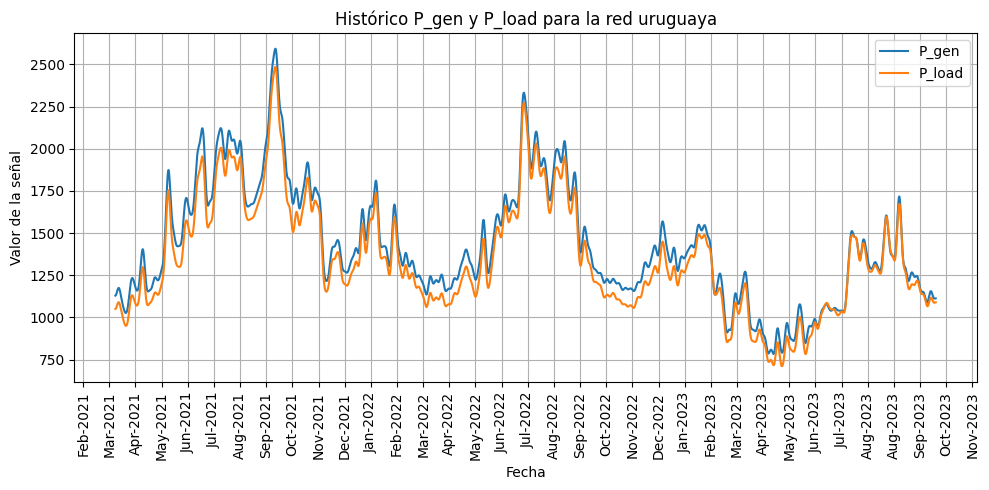

In [22]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

gen_p['Fecha'] = pd.to_datetime(gen_p['Fecha'])
all_gen = np.sum(gen_p[gen_p.columns[1:]],axis=1)
all_load = np.sum(load_p[load_p.columns[1:]],axis=1)


smoothed_signal_load = gaussian_filter1d(all_load, sigma=50)
smoothed_signal_gen = gaussian_filter1d(all_gen, sigma=50)


plt.figure(figsize=(10, 5))


plt.plot(gen_p['Fecha'], smoothed_signal_gen, label='P_gen')
plt.plot(load_p['Fecha'], smoothed_signal_load, label='P_load')

plt.title(f'Histórico P_gen y P_load para la red uruguaya')
plt.xlabel('Fecha')
plt.ylabel('Valor de la señal')
plt.legend()
plt.grid(True)

ax = plt.gca()
ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))  
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))  

plt.xticks(rotation=90)  
plt.tight_layout()  
plt.show()

### Por nodo, generacion

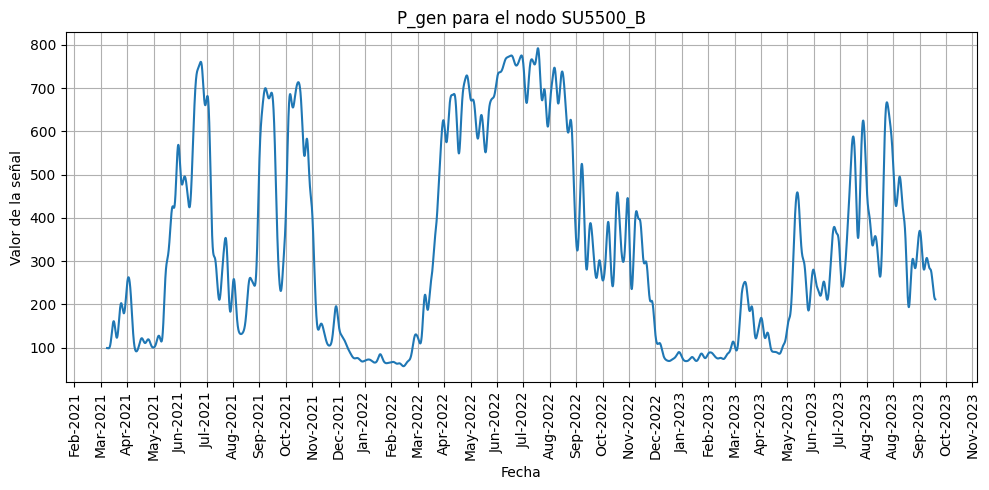

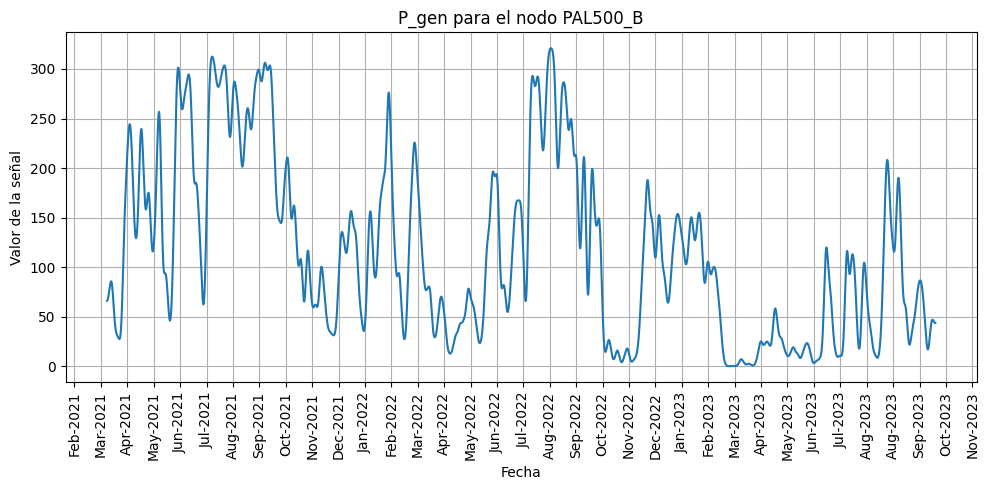

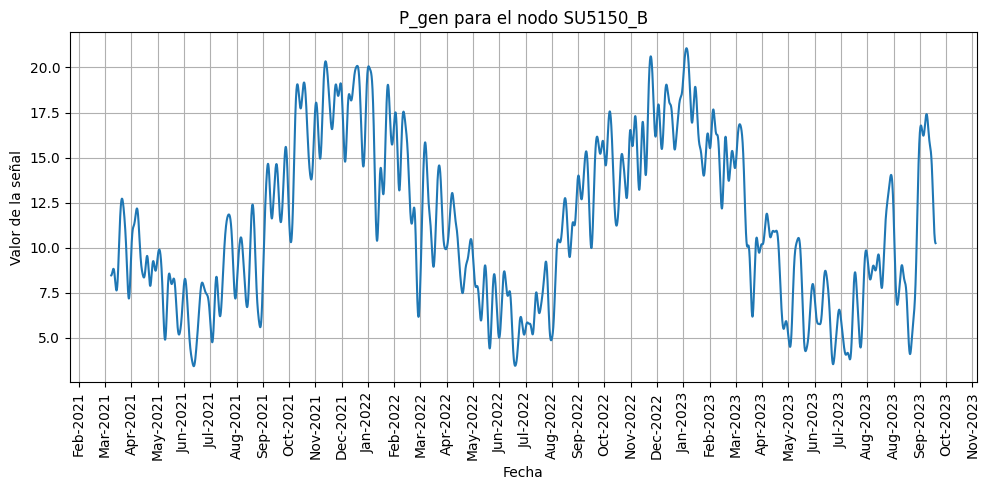

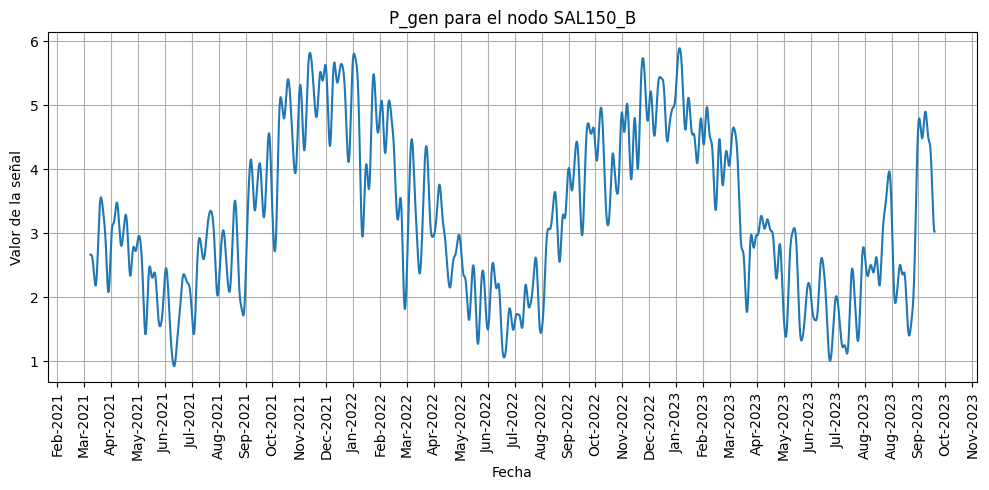

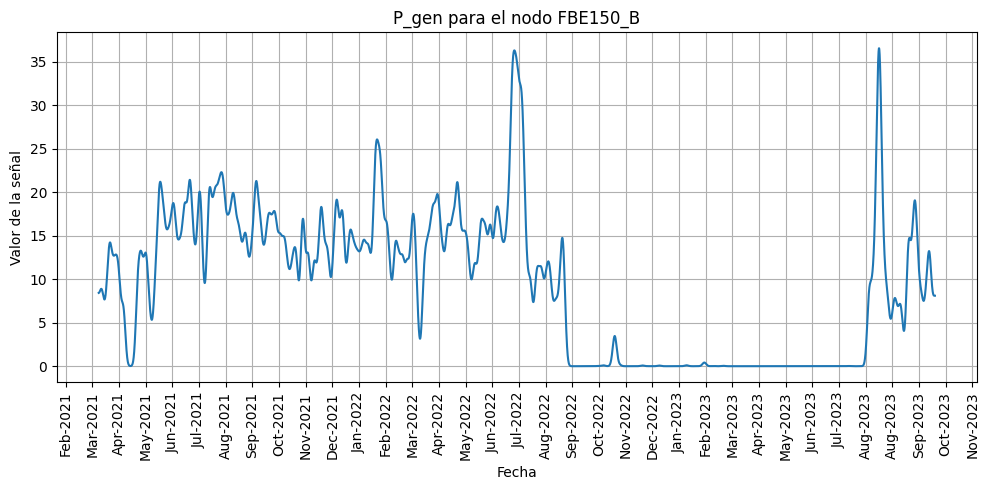

...

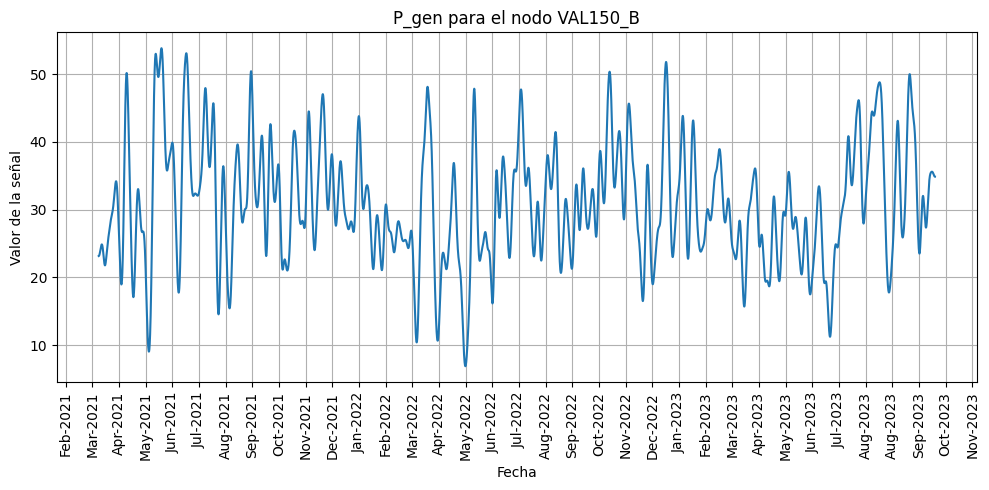

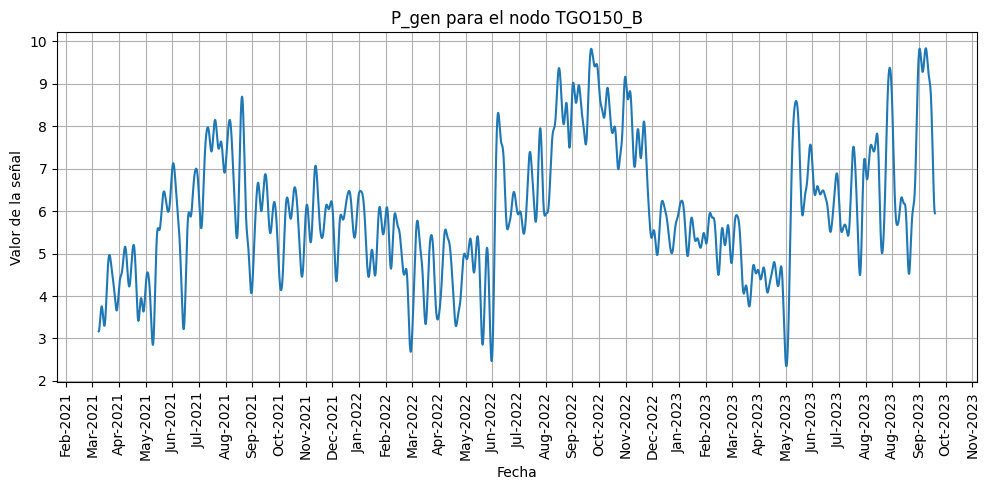

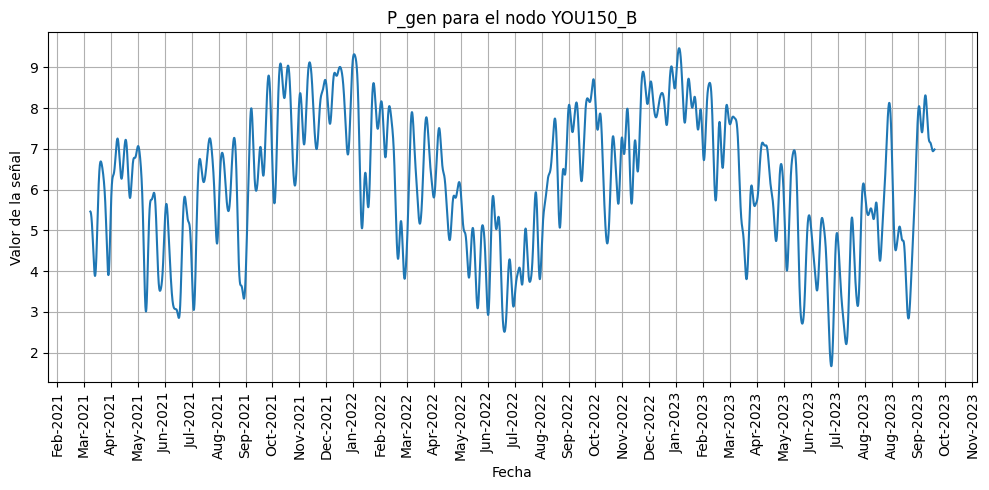

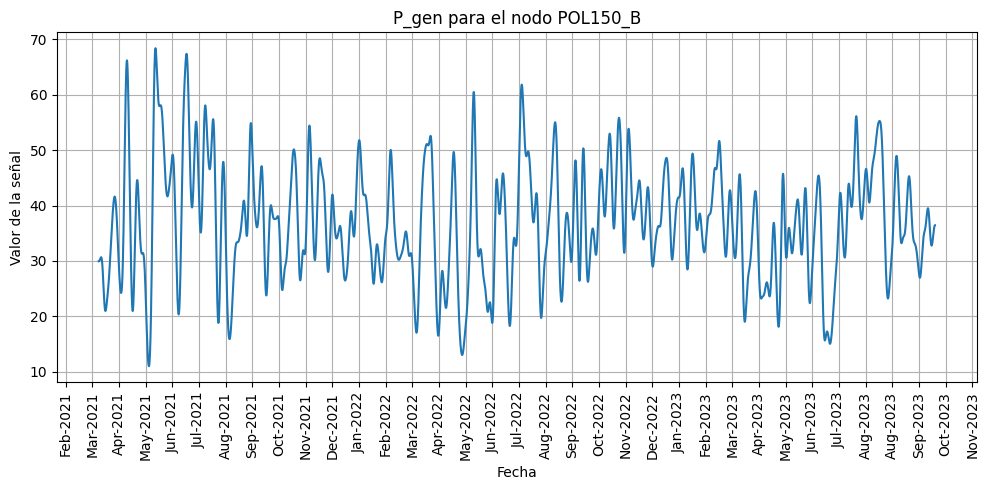

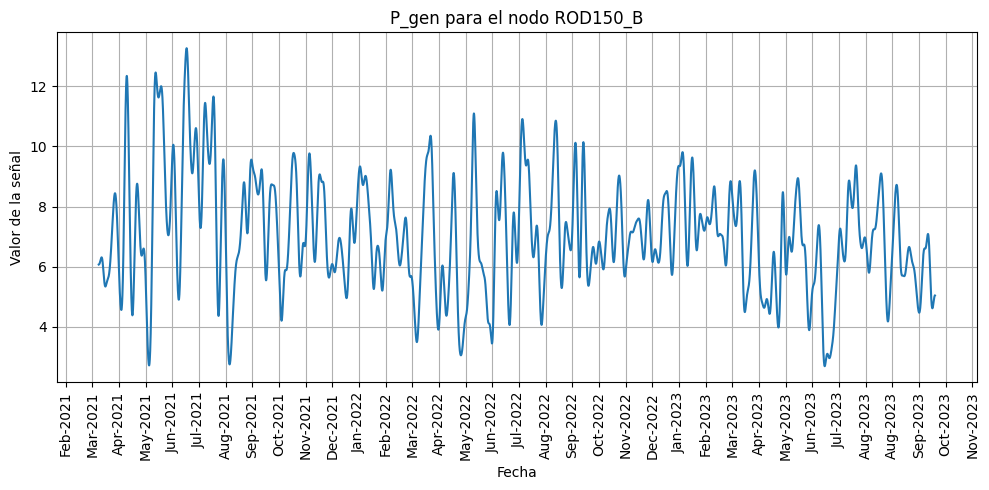

In [23]:
from scipy.ndimage import gaussian_filter1d
import matplotlib.dates as mdates

gen_p['Fecha'] = pd.to_datetime(gen_p['Fecha'])

for column in gen_p.columns[1:]:
    plt.figure(figsize=(10, 5))
    
    smoothed_signal = gaussian_filter1d(gen_p[column], sigma=50)
    
    plt.plot(gen_p['Fecha'], smoothed_signal)
    
    plt.title(f'P_gen para el nodo {net.bus.loc[int(column)].values[0]}')
    plt.xlabel('Fecha')
    plt.ylabel('Valor de la señal')
    plt.grid(True)
    
    ax = plt.gca()
    ax.xaxis.set_major_locator(mdates.DayLocator(interval=30))  
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))  
    
    plt.xticks(rotation=90)  
    plt.tight_layout()  
    plt.show()

In [34]:
p_gen = x[:, idx_sgen + idx_gen, 2:].sum(axis=2)
p_load = x[:, idx_load, :2].sum(axis=2)

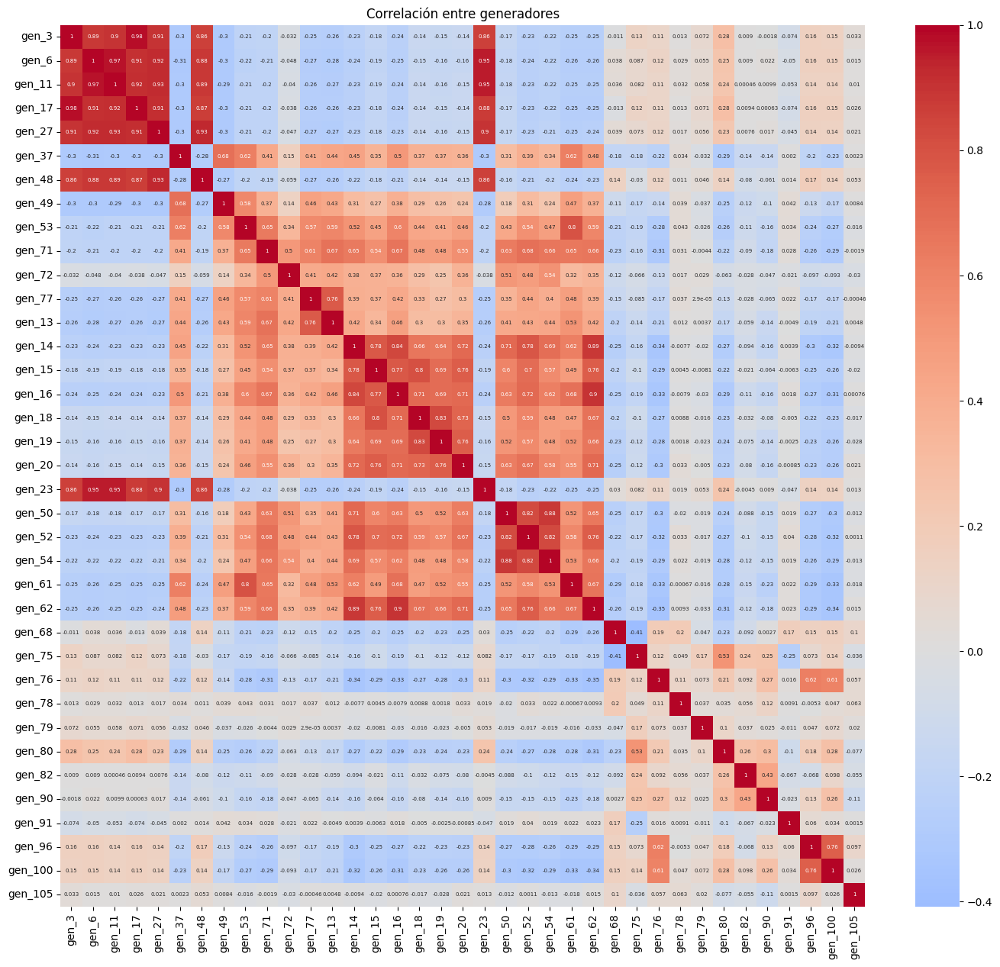

In [39]:
correlations = np.corrcoef(p_gen.T, p_gen.T)[:len(idx_sgen + idx_gen), len(idx_sgen + idx_gen):]

df_corr = pd.DataFrame(correlations, 
                       index=[f'gen_{i}' for i in idx_gen+idx_sgen],
                       columns=[f'gen_{i}' for i in idx_gen+idx_sgen])

plt.figure(figsize=(17, 15))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', center=0, annot_kws={"size": 5})
plt.title('Correlación entre generadores')
plt.show()

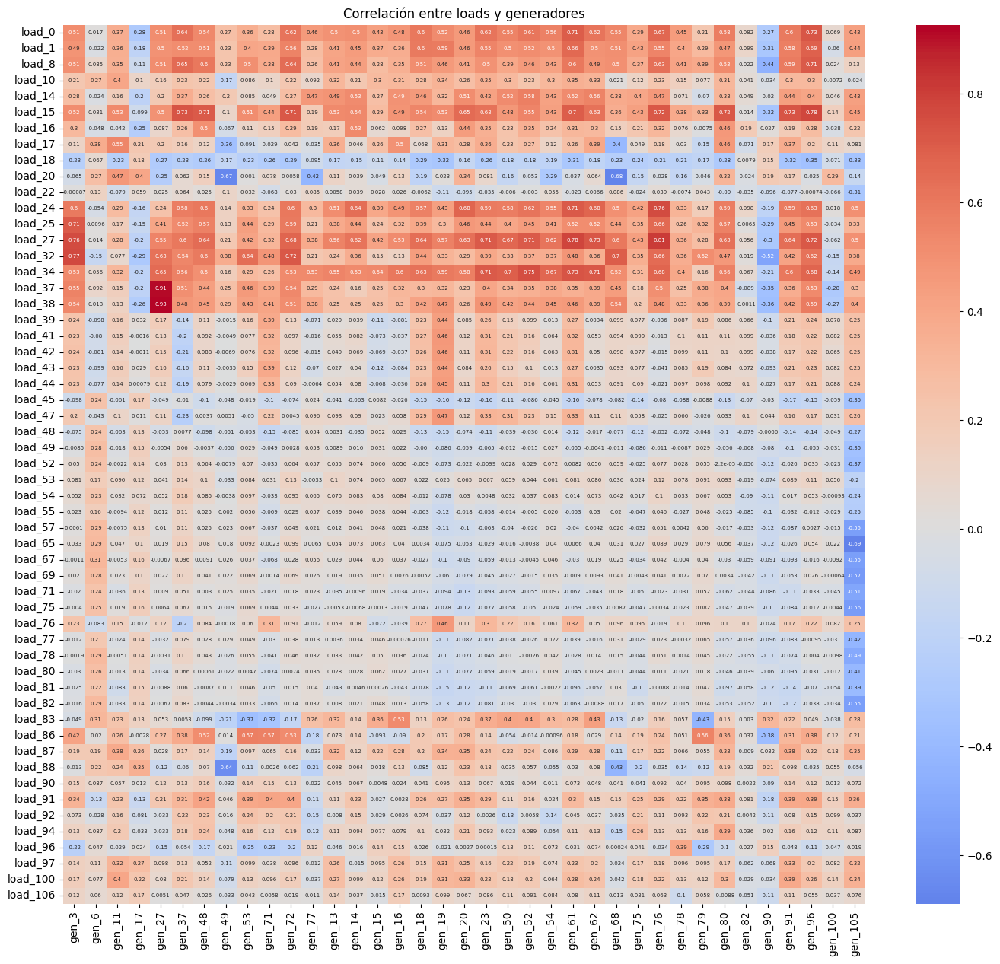

In [37]:
correlations = np.corrcoef(p_load.T, p_gen.T)[len(idx_gen+idx_sgen):, :len(idx_gen+idx_sgen)]

df_corr = pd.DataFrame(correlations, 
                       index=[f'load_{i}' for i in idx_load],
                       columns=[f'gen_{i}' for i in idx_gen+idx_sgen])

plt.figure(figsize=(17, 15))
sns.heatmap(df_corr, annot=True, cmap='coolwarm', center=0, annot_kws={"size": 5})
plt.title('Correlación entre loads y generadores')
plt.show()

## Distribucion de gens y cargas

In [36]:
import pandapower as pp
import pandas as pd
gen_p = pd.read_csv("./crudo/GENP_total_pandapower.csv")
load_p = pd.read_csv("./crudo/LOADP_total_pandapower.csv")
net = pp.from_pickle("/home/nacho/sup_uru/data/red_uru_final.p")

bus_map = {net.bus.index[i]: i for i in range(len(net.bus))}

In [7]:
load_p.head()

,Fecha,92670,92060,92090,92710,92540,92600,92690,92940,92531,92681,92440,92050,92520,92620,92730,92450,92640,92100,90200,92210,92240,92310,92320,92330,92270,92340,92180,92350,92110,92650,92500,92770,92030,92721,101,92280,92400,92760,92580,92610,92040,92700,92380,92470,92630,92410,92070,92590,92430,92420,92020,92790,92124,90480,4000
0,2021-03-21 00:00:00,9.54016,2.85,9.2640,66.376120,4.399368,11.59830,0.587500,0.0,16.964178,4.980417,1.908833,6.894720,18.042519,11.391681,35.371563,13.638973,11.238702,11.048097,17.506144,35.433334,71.637610,41.734905,18.727867,40.718433,20.622902,28.128000,13.080480,26.189192,46.920000,12.662025,-1.044159,31.325224,36.230465,10.860001,14.957973,32.006160,10.718984,11.016750,15.631658,16.475855,24.953642,4.222750,39.735,0.0315,19.686666,17.080276,2.056735,5.22774,30.464617,5.878872,0.0,0.0,29.633230,0.0,0.0
1,2021-03-21 01:00:00,9.10546,2.85,8.3496,58.543438,4.180183,10.86666,0.535416,0.0,15.766742,4.980417,1.600500,6.172739,16.252790,10.661353,32.137966,12.877617,10.217931,9.718098,16.257406,31.688889,67.454350,37.593906,16.385600,38.605633,19.092535,26.608000,11.697841,24.021760,41.860000,11.553070,-1.044159,29.315641,34.186024,9.633333,14.125060,29.451520,10.522411,10.353480,12.920845,15.851083,22.595000,4.416666,35.550,0.0315,18.240000,15.778558,1.992122,4.71114,28.542816,5.077523,0.0,0.0,26.578936,0.0,0.0
2,2021-03-21 02:00:00,9.01852,2.85,7.8324,56.421986,3.741814,10.07244,0.483333,0.0,14.922965,4.980417,1.963167,5.666220,15.176098,10.320066,29.925034,12.094967,9.558402,8.658097,15.274316,29.011110,63.454346,34.544790,14.814797,37.118378,17.889566,25.171202,10.815839,23.146599,37.960000,10.954121,-1.044159,27.670227,32.768246,9.033334,13.213126,26.277160,10.129264,9.806729,10.354908,15.318105,20.870071,3.786166,32.700,0.0315,16.699999,14.660213,1.669057,4.37220,27.347145,4.726720,0.0,0.0,24.219000,0.0,17.0
3,2021-03-21 03:00:00,9.01852,2.85,7.6644,54.428380,3.741814,9.55458,0.483333,0.0,14.490529,4.980417,2.983000,5.240970,14.514262,10.135986,28.400965,11.399478,9.211662,8.270097,14.414059,26.600000,61.346493,32.485455,13.948002,36.274616,17.346909,24.440000,10.130400,21.788885,35.960003,10.624652,-1.044159,26.835455,31.923800,8.653334,12.932271,24.647240,10.038821,9.714869,5.157061,14.920334,20.064760,3.362000,30.720,0.0315,16.153334,13.965443,1.669057,4.03704,27.032219,4.494330,0.0,0.0,22.805674,0.0,70.0
4,2021-03-21 04:00:00,9.01852,2.85,7.1424,50.567190,3.741814,9.46890,0.483333,0.0,14.237397,4.980417,2.417833,5.155920,14.694003,10.362067,27.783295,11.137993,8.661890,7.910098,13.558423,25.300001,60.041870,31.495926,13.446396,35.970165,16.838167,24.147200,9.959040,20.439350,34.700000,10.103917,-1.044159,26.394926,30.879356,8.270000,12.395312,23.718481,9.586611,9.254519,4.694994,14.346478,19.346731,5.600584,29.565,0.0315,15.780002,13.598366,1.669057,4.03704,26.920113,4.305740,0.0,0.0,22.201859,0.0,205.0


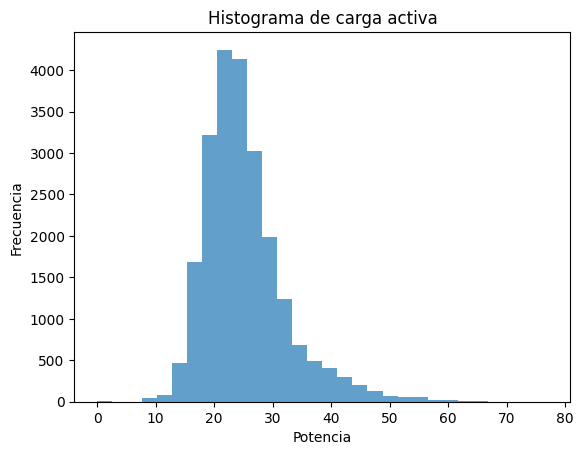

In [14]:
# for node in load_p.columns[1:]:
plt.hist(load_p['101'], bins=30,alpha=0.7) 
plt.title(f'Histograma de carga activa')
plt.xlabel('Potencia')
plt.ylabel('Frecuencia')
# plt.xlim(0.89,1.11)
# plt.ylim(0,1200)
plt.show()

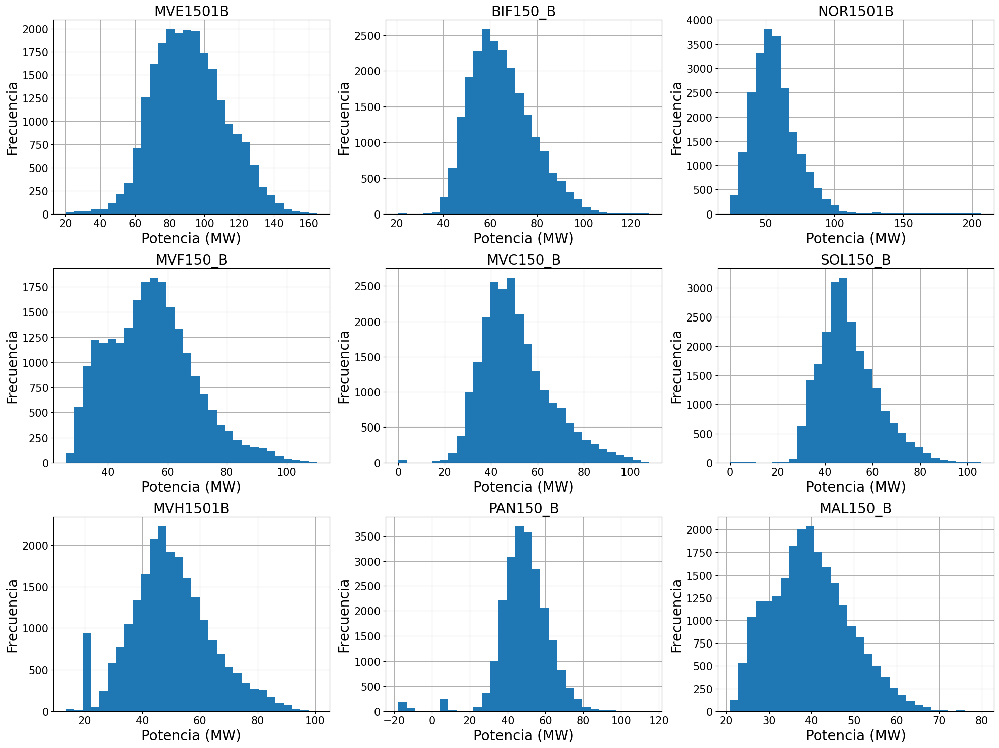

In [39]:
rows, cols = 3, 3  # Adjust these numbers as needed

fig, axes = plt.subplots(rows, cols, figsize=(20, 15))
top_loads = load_p[load_p.columns[1:]].mean().sort_values(ascending=False).head(10).index # top 12 loads
top_loads = top_loads.delete(1)

for i in range(rows):
    for j in range(cols):
        node = top_loads[i * cols + j]
        
        ax = axes[i, j]
        ax.hist(load_p[node], bins=30) 
        ax.set_title(net.bus.loc[int(node)].values[0], fontsize=20)
        ax.set_xlabel('Potencia (MW)', fontsize=20)
        ax.set_ylabel('Frecuencia', fontsize=20)
        # increase font size of ticks
        ax.tick_params(axis='both', which='major', labelsize=15)
        
        #set grid below the plot
        ax.set_axisbelow(True)
        ax.grid()

plt.tight_layout()
plt.show()

# save img in pdf
fig.savefig('top_loads.pdf')

In [53]:
import matplotlib.pyplot as plt
import pandas as pd

gen_path = '/home/nacho/sup_uru/data/generacion'
def plot_load_mean_per_hour(load_p, colors, save_fig=None):
    gen_path = '/home/nacho/sup_uru/data/generacion'
    list = os.listdir(gen_path)
    año = {}
    años = ['2021', '2022', '2023']
    archivos_por_año = sorted(list[1:-1])[:2],sorted(list[1:-1])[2:4],sorted(list[1:-1])[4:]
    seasons = ['verano', 'otoño', 'invierno', 'primavera']
    fig, ax = plt.subplots(1, 3, figsize=(21, 5))
    
    dates = load_p.iloc[:,0].to_list()
    values = load_p.iloc[:,1:-2].sum(axis=1).to_list()
    
    indices = {}
    indices['verano'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [12, 1, 2]]
    indices['invierno'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [6, 7, 8]]
    indices['otoño'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [3, 4, 5]]
    indices['primavera'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [9, 10, 11]]
    #check that no indice is repeated
    assert len(set(indices['verano']).intersection(set(indices['invierno'])).intersection(set(indices['otoño'])).intersection(set(indices['primavera'])))==0
    
    # print(hours['primavera'])
    for year in años:
        gen_per_season = {'verano':[[] for i in range(24)], 'invierno':[[] for i in range(24)], 'primavera':[[] for i in range(24)], 'otoño':[[] for i in range(24)]}
        for season in seasons:
            for h in range(24):
                gen_per_season[season][h] += [values[j] for j in indices[season] if int(dates[j].split(' ')[1].split(':')[0])==h if int(dates[j].split(' ')[0].split('-')[0])==int(year)]
        año[year] = gen_per_season   
            
        
    # determine highest and lowest values for y-axis limits
    max_val = max([np.mean(gen_per_season[season][h]) for gen_per_season in año.values() for season in seasons for h in range(24)])
    min_val = min([np.mean(gen_per_season[season][h]) for gen_per_season in año.values() for season in seasons for h in range(24)])
    print(min_val, max_val)
    for y,gen_per_season in enumerate(año.values()):
        for i,season in enumerate(seasons):
            means = []
            for h in range(24):
                mean = np.mean(gen_per_season[season][h])
                var = np.std(gen_per_season[season][h])
                means.append(mean)
                if h == 0:  # Add legend only once per season
                    ax[y].plot(h, mean, 'o', color=colors[i], label=season)
                else:
                    ax[y].plot(h, mean, 'o', color=colors[i])
                # ax[y].errorbar(h, mean, yerr=var, fmt='o', color=colors[i])
            ax[y].plot(np.arange(24), means, '-', color=colors[i])
        # plt.title(f'Generación promedio por estación del año y por hora para el generador {a.loc[:,gen].iloc[0]}')
        ax[y].set_title(años[y], fontsize=20)
        ax[y].set_ylabel('Potencia (MW)', fontsize=20)
        ax[y].set_xlabel('Hora', fontsize=20)
        ax[y].set_axisbelow(True)
        ax[y].grid()
        ax[y].legend(fontsize=17)
        ax[y].set_ylim(min_val-5, max_val+5)
        
        ax[y].tick_params(axis='both', which='major', labelsize=14)  # Major ticks
        ax[y].tick_params(axis='both', which='minor', labelsize=14)  # Minor ticks (if any)
        # if min_val>=0:
        #     ax[y].set_ylim(min_val*0.95, max_val*1.05)
        # else:
        #     ax[y].set_ylim(-max_val*0.05, max_val*1.05)
            
        # plt.xlabel('Hora')
        # plt.ylabel('Potencia (MW)')
        # plt.grid()
        # plt.legend()
    # bold title
    fig.suptitle('Carga total', fontsize=20, fontweight='bold')
    plt.subplots_adjust(top=0.8)  # Adjust 'top' value to control the space
    # print(f'Generación promedio por año, estación y hora para el generador {gen.split('.')[0].lower()} {a.loc[:,gen].iloc[0]}')
    # plt.subplots_adjust(hspace=0.5)  # Increase vertical space between subplots
    # plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()
    
    
    return fig

838.4357767057917 1702.6447654388917


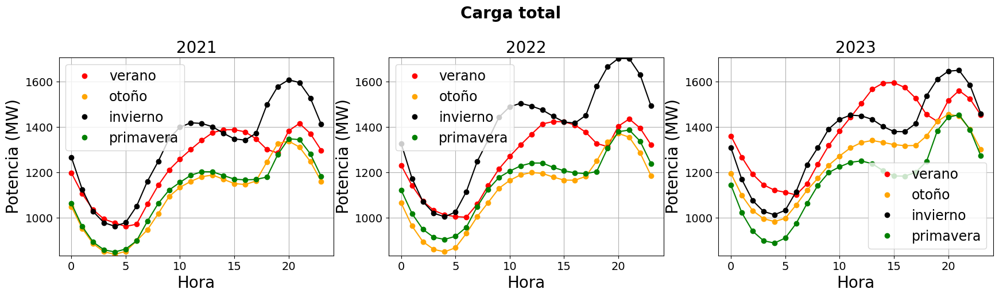

In [54]:
fig = plot_load_mean_per_hour(load_p,['red', 'orange', 'black', 'green'])
fig.savefig('/home/nacho/sup_uru/data/generacion/imgs/'+'carga_por_estacion_y_hora.pdf')

## Dist por clasificacion de gen


In [157]:
gen_path = '/home/nacho/sup_uru/data/generacion'
# from xlsx to csv
# for file in os.listdir(gen_path):
#     if file.endswith('.xlsx'):
#         df = pd.read_excel(f'{gen_path}/{file}')
#         df.to_csv(f'{gen_path}/{file.replace(".xlsx", ".csv")}', index=False)

archivos_csv = [archivo for archivo in os.listdir(gen_path) if archivo.endswith('.csv')]

# DataFrame vacío para almacenar los datos concatenados
df_concatenado = pd.DataFrame()

# Iterar sobre cada archivo CSV
for i, archivo in enumerate(archivos_csv):
    ruta_completa = os.path.join(gen_path, archivo)
    df = pd.read_csv(ruta_completa)
    
    # Si no es el primer archivo, eliminar la primera fila
    if i != 0:
        df = df.iloc[1:]
    
    df_concatenado = pd.concat([df_concatenado, df],ignore_index=True, sort=False).fillna(0)

# Guardar el DataFrame concatenado en un nuevo archivo CSV
df_concatenado.to_csv(gen_path + '/archivo_concatenado.csv', index=False)

# df_1 = pd.read_excel('/home/nacho/sup_uru/data/generacion/xlsx/GEN_ADME.xlsx')
# df_1.to_csv('/home/nacho/sup_uru/data/generacion/GEN_ADME.csv', index=False)

/tmp/ipykernel_538660/3348883184.py:16: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(ruta_completa)
/tmp/ipykernel_538660/3348883184.py:16: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,

/tmp/ipykernel_538660/3348883184.py:16: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(ruta_completa)
/tmp/ipykernel_538660/3348883184.py:16: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,

In [ ]:
file = 'archivo_concatenado.csv'
df = pd.read_csv(f'{gen_path}/{file}')

In [ ]:
# df.drop_duplicates(inplace=True)
# df = df.fillna(0.)
df.shape

In [100]:
from tqdm import tqdm
def convertir_a_float_si_posible(x, fila, columna):
    try:
        return float(x)
    except ValueError:
        print(f"Texto encontrado en la fila {fila}, columna '{columna}': {x}")
        return x

# Supongamos que df es tu DataFrame
for i, fila in tqdm(df.iloc[1:,1:].iterrows(),total=df.iloc[1:,1:].shape[0]):
    for columna in df.iloc[1:,1:].columns:
        df.iloc[1:,1:].at[i, columna] = convertir_a_float_si_posible(df.iloc[1:,1:].at[i, columna], i, columna)


['Gen por central desde 2022_06 hasta 2022_12.csv',
 'Gen por central desde 2023_06 hasta 2023_12.csv',
 'Gen por central desde 2021_01 hasta 2021_06.csv',
 'Gen por central desde 2021_06 hasta 2021_12.csv',
 'Gen por central desde 2022_01 hasta 2022_06.csv',
 'Gen por central desde 2023_01 hasta 2023_06.csv']

In [161]:
first_row = df.iloc[0]
first_column = df.iloc[:, 0]

# # # Convertimos el resto del DataFrame a float (excepto la primera fila y columna)
df.iloc[1:, 1:] = df.iloc[1:, 1:].astype(float)
# # # Restauramos la primera fila y la primera columna
df.iloc[0] = first_row
df.iloc[:, 0] = first_column

ValueError: could not convert string to float: '01-01-2023 00:00'

### CSVs por separado

In [58]:
list = sorted(os.listdir(gen_path))[:-3]
list

['Gen por central desde 2021_01 hasta 2021_06.csv',
 'Gen por central desde 2021_06 hasta 2021_12.csv',
 'Gen por central desde 2022_01 hasta 2022_06.csv',
 'Gen por central desde 2022_06 hasta 2022_12.csv',
 'Gen por central desde 2023_01 hasta 2023_06.csv',
 'Gen por central desde 2023_06 hasta 2023_12.csv']

In [59]:
import numpy as np
import pandas as pd
gen_path = '/home/nacho/sup_uru/data/generacion'


list = os.listdir(gen_path)

for i,file in enumerate(sorted(os.listdir(gen_path))[:-3]):
    a = pd.read_csv(f'{gen_path}/{file}')[1:]
    first_row = a.iloc[0]
    first_column = a.iloc[:, 0]

    # # # Convertimos el resto del DataFrame a float (excepto la primera fila y columna)
    a.iloc[1:, 1:] = a.iloc[1:, 1:].astype(float)
    # # # Restauramos la primera fila y la primera columna
    a.iloc[0] = first_row
    a.iloc[:, 0] = first_column
    if i%2==0:
        a = a.iloc[:-720]
    if i==0:
        sums = a.iloc[1:, 1:].sum()
    else:
        sums += a.iloc[1:, 1:].sum()
    
    
    
    # a[a.columns[1:]].sum(axis=1)

        # GEN_i.columns = GEN_i.iloc[0]
    # GEN_i = GEN_i.drop(0,axis=0)

/tmp/ipykernel_3515/3502556785.py:9: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')[1:]
/tmp/ipykernel_3515/3502556785.py:9: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

In [4]:
sums.sort_values(ascending=False)


Hidráulico                        8737234.95
Hidráulico.3                    2953879.4408
Biomasa.5                       1645361.8205
Hidráulico.2                    1440260.4399
Eólico.36                       1352106.5202
Exportación Contingente           1083112.97
Hidráulico.1                     987379.0478
Eólico.11                         776633.107
Eólico.28                        766565.0494
Eólico.29                         751682.626
Eólico.2                          731728.688
Exportación Spot.12                636279.56
Térmico.1                        614713.2778
Eólico.34                        578107.9926
Exportación Spot.3                 575287.43
Importación.17                     569574.98
Eólico.43                          557866.92
Eólico.8                          540079.785
Eólico.10                         525451.696
Eólico.33                        501146.6954
Eólico.20                          499546.78
Eólico.31                        496021.9183
Eólico.5  

In [60]:
Eolicos = ['Eólico.36', 'Eólico.11', 'Eólico.28', 'Eólico.29']
Solares = ['Solar.15', 'Solar.10', 'Solar.8', 'Solar.3']
Hidraulicos = ['Hidráulico','Hidráulico.3', 'Hidráulico.2', 'Hidráulico.1']
Biomasa = ['Biomasa.5', 'Biomasa.4', 'Biomasa.6', 'Biomasa.9']
Termicos = ['Térmico.1', 'Térmico.4', 'Térmico.3', 'Térmico.2']

In [68]:
sorted(list)[:-3]

['Gen por central desde 2021_01 hasta 2021_06.csv',
 'Gen por central desde 2021_06 hasta 2021_12.csv',
 'Gen por central desde 2022_01 hasta 2022_06.csv',
 'Gen por central desde 2022_06 hasta 2022_12.csv',
 'Gen por central desde 2023_01 hasta 2023_06.csv',
 'Gen por central desde 2023_06 hasta 2023_12.csv']

In [69]:
import matplotlib.pyplot as plt
def plot_4hists(gens, color, save_fig=None):
    gen_path = '/home/nacho/sup_uru/data/generacion'

    e1, e2, e3, e4 = [],[],[],[]
    for i,file in enumerate(sorted(list)[:-3]):
        a = pd.read_csv(f'{gen_path}/{file}')
        first_row = a.iloc[0]
        first_column = a.iloc[:, 0]

        # # # Convertimos el resto del DataFrame a float (excepto la primera fila y columna)
        a.iloc[1:, 1:] = a.iloc[1:, 1:].astype(float)
        # # # Restauramos la primera fila y la primera columna
        a.iloc[0] = first_row
        a.iloc[:, 0] = first_column
        if i%2==0:
            a = a.iloc[:-720]
        
        for i,e in enumerate(gens):
            if i==0:
                e1.append(a.loc[:,e][1:].values.astype(float))
            elif i==1:
                e2.append(a.loc[:,e][1:].values.astype(float))
            elif i==2:
                e3.append(a.loc[:,e][1:].values.astype(float))
            else:
                e4.append(a.loc[:,e][1:].values.astype(float))
                
    e1 = np.concatenate(e1)
    e2 = np.concatenate(e2)
    e3 = np.concatenate(e3)
    e4 = np.concatenate(e4)
    
    # # largest value of all
    # max_val = max([e1.max(), e2.max(), e3.max(), e4.max()])
    # max_val += max_val * 0.1
    
    # # find the largest frequency of all
    # max_freq = max([np.histogram(e1, bins=30)[0].max(), np.histogram(e2, bins=30)[0].max(), np.histogram(e3, bins=30)[0].max(), np.histogram(e4, bins=30)[0].max()])
    # max_freq += max_freq * 0.1

    fig, axs = plt.subplots(2, 2, figsize=(10, 8))
    # Plot histograms in each subplot
    axs[0, 0].hist(e1, bins=30, color=color, edgecolor='black')
    axs[0, 0].set_title(a.loc[:,gens[0]].iloc[0])
    axs[0, 0].set_xlabel('Potencia (MW)')
    axs[0, 0].set_ylabel('Frecuencia')
    axs[0, 0].set_axisbelow(True)
    axs[0, 0].grid()
    # axs[0, 0].set_ylim(0, max_freq)
    # axs[0, 0].set_xlim(0, max_val)
    
    axs[0, 1].hist(e2, bins=30, color=color, edgecolor='black')
    axs[0, 1].set_title(a.loc[:,gens[1]].iloc[0])
    axs[0, 1].set_xlabel('Potencia (MW)')
    axs[0, 1].set_ylabel('Frecuencia')
    axs[0, 1].set_axisbelow(True)
    axs[0, 1].grid()
    # axs[0, 1].set_ylim(0, max_freq)
    # axs[0, 1].set_xlim(0, max_val)
    
    axs[1, 0].hist(e3, bins=30, color=color, edgecolor='black')
    axs[1, 0].set_title(a.loc[:,gens[2]].iloc[0])
    axs[1, 0].set_xlabel('Potencia (MW)')
    axs[1, 0].set_ylabel('Frecuencia')
    axs[1, 0].set_axisbelow(True)
    axs[1, 0].grid()
    # axs[1, 0].set_ylim(0, max_freq)
    # axs[1, 0].set_xlim(0, max_val)
    
    axs[1, 1].hist(e4, bins=30, color=color, edgecolor='black')
    axs[1, 1].set_title(a.loc[:,gens[3]].iloc[0])
    axs[1, 1].set_xlabel('Potencia (MW)')
    axs[1, 1].set_ylabel('Frecuencia')
    axs[1, 1].set_axisbelow(True)
    axs[1, 1].grid()
    # axs[1, 1].set_ylim(0, max_freq)
    # axs[1, 1].set_xlim(0, max_val)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()
    
    if save_fig is not None:
        fig.savefig(f'{gen_path}/imgs/histograma_{save_fig}.pdf')
    

/tmp/ipykernel_3515/737345011.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_3515/737345011.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83

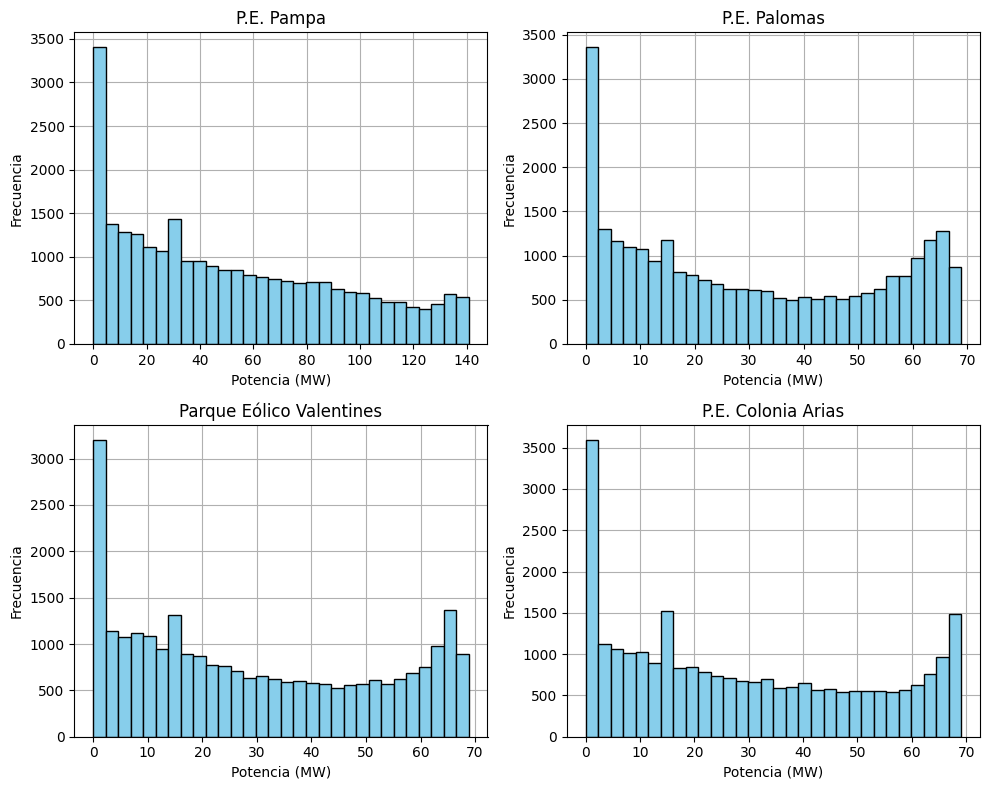

In [70]:
plot_4hists(Eolicos,'skyblue',save_fig='Eolicos')

/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

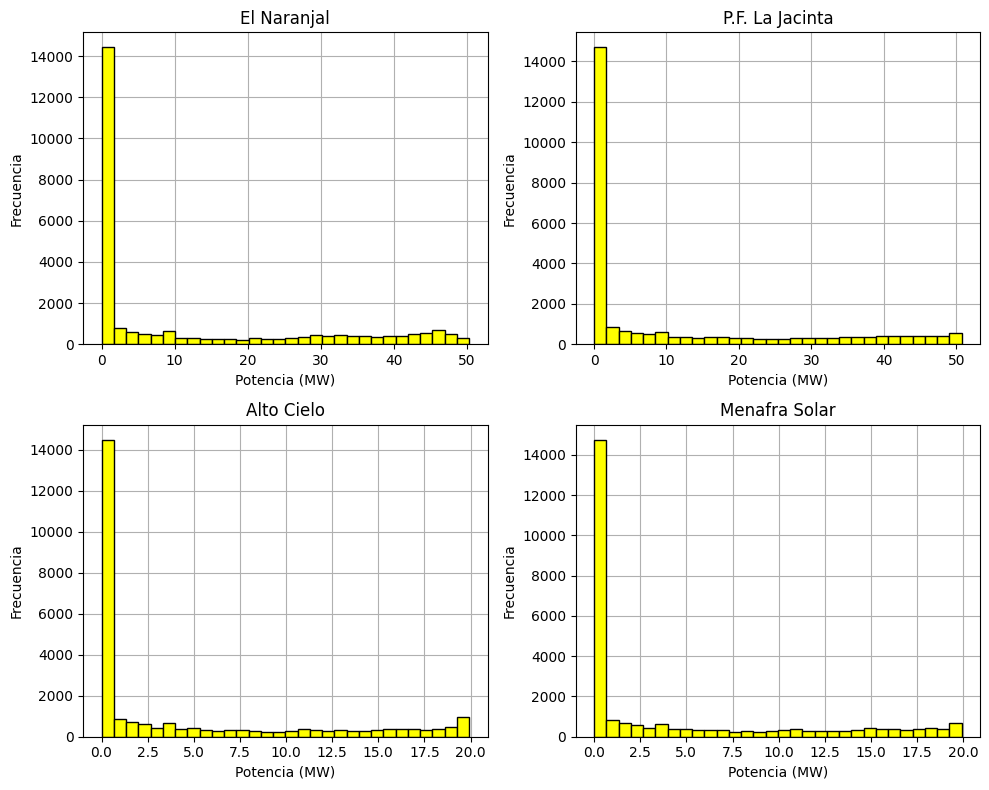

In [11]:
plot_4hists(Solares,'yellow','Solares')

/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

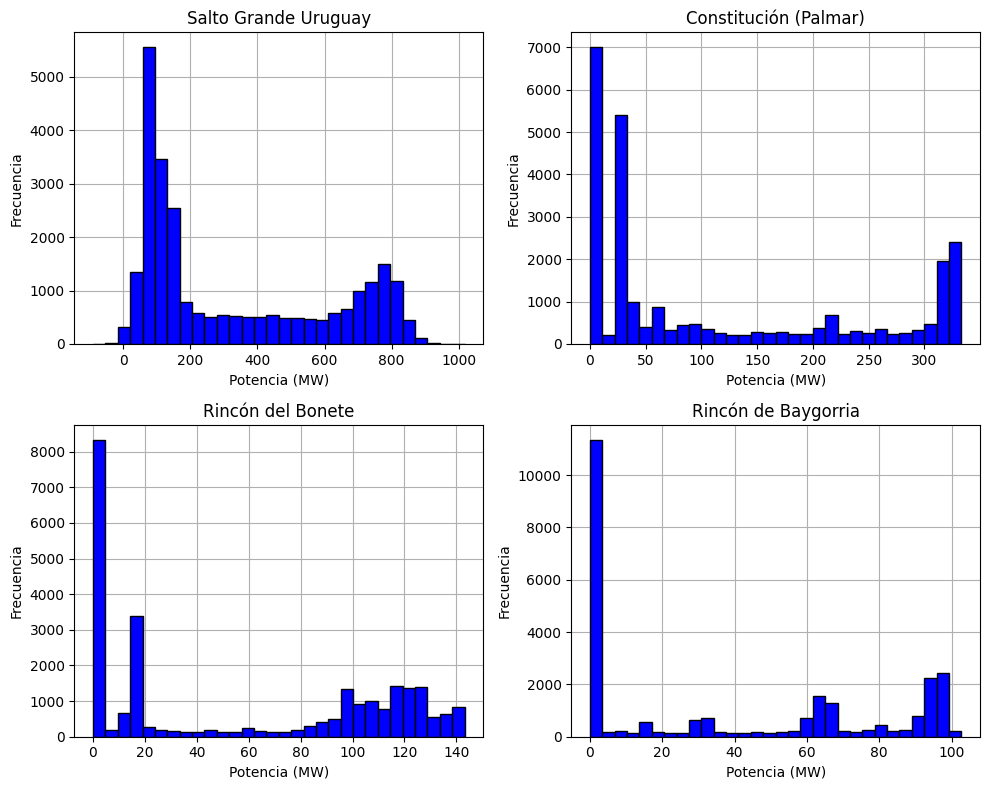

In [12]:
plot_4hists(Hidraulicos,'blue','Hidraulicos')

/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

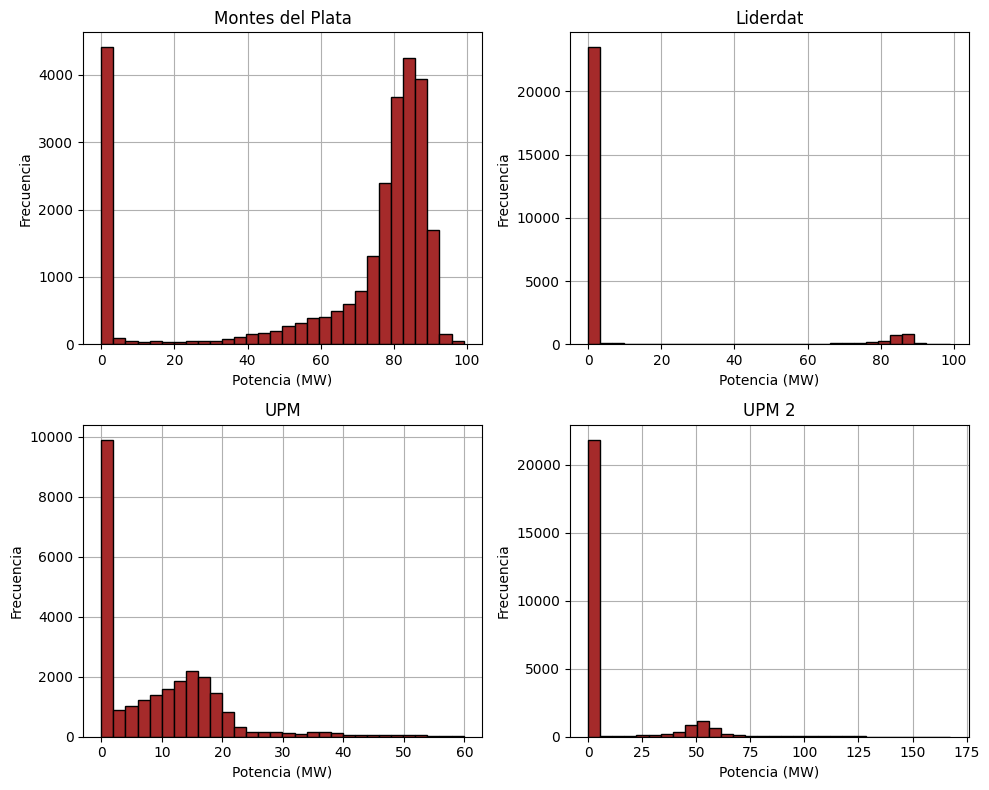

In [13]:
plot_4hists(Biomasa,'brown','Biomasa')

/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_622486/4128404326.py:7: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

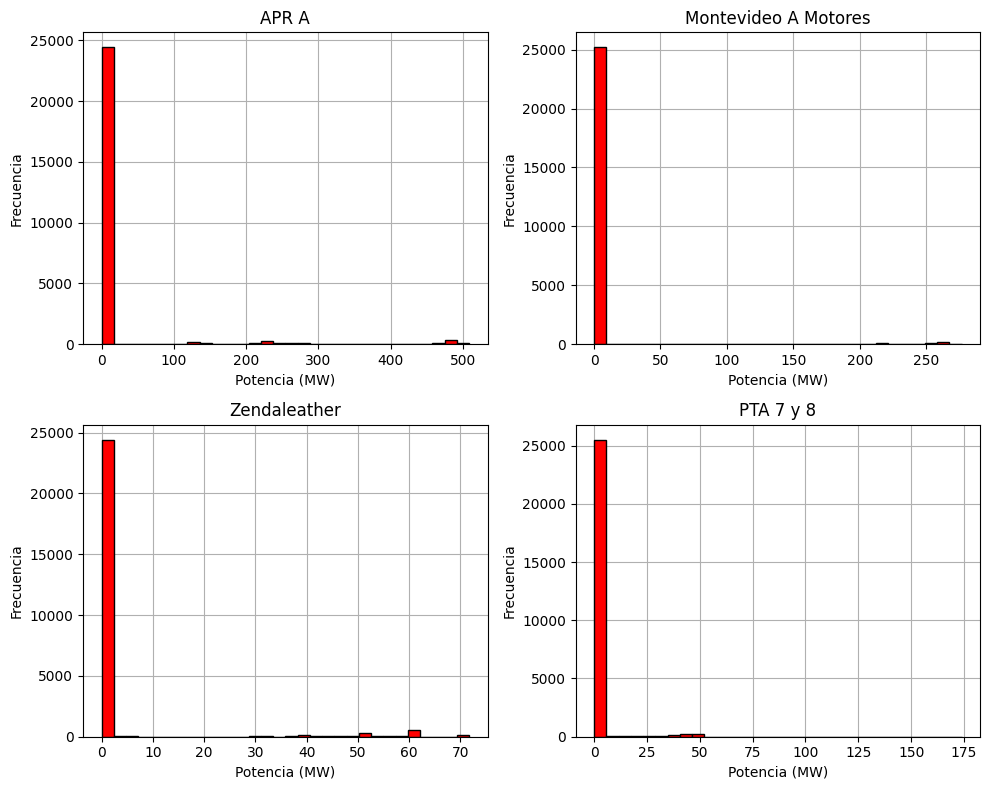

In [14]:
plot_4hists(Termicos,'red','Termicos')

In [71]:
Eolicos = ['Eólico.36', 'Eólico.11', 'Eólico.28', 'Eólico.29']
Solares = ['Solar.15', 'Solar.10', 'Solar.8', 'Solar.3']
Hidraulicos = ['Hidráulico','Hidráulico.3', 'Hidráulico.2', 'Hidráulico.1']
Biomasa = ['Biomasa.5', 'Biomasa.4', 'Biomasa.6', 'Biomasa.9']
Termicos = ['Térmico.1', 'Térmico.4', 'Térmico.3', 'Térmico.2']


In [73]:
for i in sorted(list[1:-1])[:2],sorted(list[1:-1])[2:4],sorted(list[1:-1])[4:-1]:
    print(i)

['Gen por central desde 2021_01 hasta 2021_06.csv', 'Gen por central desde 2021_06 hasta 2021_12.csv']
['Gen por central desde 2022_01 hasta 2022_06.csv', 'Gen por central desde 2022_06 hasta 2022_12.csv']
['Gen por central desde 2023_01 hasta 2023_06.csv', 'Gen por central desde 2023_06 hasta 2023_12.csv']


In [74]:
import matplotlib.pyplot as plt
import pandas as pd

gen_path = '/home/nacho/sup_uru/data/generacion'
def plot_mean_var_per_hour(gen, colors, save_fig=None):
    gen_path = '/home/nacho/sup_uru/data/generacion'
    list = os.listdir(gen_path)
    año = {}
    años = ['2021', '2022', '2023']
    archivos_por_año = sorted(list[1:-1])[:2],sorted(list[1:-1])[2:4],sorted(list[1:-1])[4:-1]
    seasons = ['verano', 'otoño', 'invierno', 'primavera']
    fig, ax = plt.subplots(1, 3, figsize=(20, 5))
    
    for g,files in enumerate(archivos_por_año):
        gen_per_season = {'verano':[[] for i in range(24)], 'invierno':[[] for i in range(24)], 'primavera':[[] for i in range(24)], 'otoño':[[] for i in range(24)]}
        for i,file in enumerate(files):
            a = pd.read_csv(f'{gen_path}/{file}')
            first_row = a.iloc[0]
            first_column = a.iloc[:, 0]

            # # # Convertimos el resto del DataFrame a float (excepto la primera fila y columna)
            a.iloc[1:, 1:] = a.iloc[1:, 1:].astype(float)
            # # # Restauramos la primera fila y la primera columna
            a.iloc[0] = first_row
            a.iloc[:, 0] = first_column
            if i%2==0:
                a = a.iloc[:-720]
            
            dates = a.iloc[1:,0].tolist()
            indices = {}
            indices['verano'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [12, 1, 2]]
            indices['invierno'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [6, 7, 8]]
            indices['otoño'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [3, 4, 5]]
            indices['primavera'] = [i for i,date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [9, 10, 11]]
            #check that no indice is repeated
            assert len(set(indices['verano']).intersection(set(indices['invierno'])).intersection(set(indices['otoño'])).intersection(set(indices['primavera'])))==0
            
            # print(hours['primavera'])
            for season in seasons:
                for h in range(24):
                    gen_per_season[season][h] += [a.loc[j+1,gen] for j in indices[season] if int(a.iloc[j+1,0].split(' ')[1].split(':')[0])==h] # el +1 va para saltar la fila que tiene los nombres
            año[años[g]] = gen_per_season   
            
        #plot
        # fig = plt.figure(figsize=(10, 8))
        
    # determine highest and lowest values for y-axis limits
    max_val = max([np.mean(gen_per_season[season][h]) for gen_per_season in año.values() for season in seasons for h in range(24)])
    min_val = min([np.mean(gen_per_season[season][h]) for gen_per_season in año.values() for season in seasons for h in range(24)])
    print(min_val, max_val)
    for y,gen_per_season in enumerate(año.values()):
        for i,season in enumerate(seasons):
            means = []
            for h in range(24):
                mean = np.mean(gen_per_season[season][h])
                var = np.std(gen_per_season[season][h])
                means.append(mean)
                if h == 0:  # Add legend only once per season
                    ax[y].plot(h, mean, 'o', color=colors[i], label=season)
                else:
                    ax[y].plot(h, mean, 'o', color=colors[i])
                # ax[y].errorbar(h, mean, yerr=var, fmt='o', color=colors[i])
            ax[y].plot(np.arange(24), means, '-', color=colors[i])
        # plt.title(f'Generación promedio por estación del año y por hora para el generador {a.loc[:,gen].iloc[0]}')
        ax[y].set_title(años[y], fontsize=20)
        ax[y].set_ylabel('Potencia (MW)', fontsize=15)
        ax[y].set_xlabel('Hora', fontsize=15)
        ax[y].set_axisbelow(True)
        ax[y].grid()
        ax[y].legend(fontsize=13)
        ax[y].set_ylim(min_val-5, max_val+5)
        
        ax[y].tick_params(axis='both', which='major', labelsize=12)  # Major ticks
        ax[y].tick_params(axis='both', which='minor', labelsize=12)  # Minor ticks (if any)
        # if min_val>=0:
        #     ax[y].set_ylim(min_val*0.95, max_val*1.05)
        # else:
        #     ax[y].set_ylim(-max_val*0.05, max_val*1.05)
            
        # plt.xlabel('Hora')
        # plt.ylabel('Potencia (MW)')
        # plt.grid()
        # plt.legend()
    fig.suptitle(f'{a.loc[:,gen].iloc[0]} ({gen.split('.')[0].lower()})', fontsize=20)
    plt.subplots_adjust(top=0.8)  # Adjust 'top' value to control the space
    print(f'Generación promedio por año, estación y hora para el generador {gen.split('.')[0].lower()} {a.loc[:,gen].iloc[0]}')
    # plt.subplots_adjust(hspace=0.5)  # Increase vertical space between subplots
    # plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to make room for the title
    plt.show()
    
    return fig

/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

29.258858695652176 77.83943956043956
Generación promedio por año, estación y hora para el generador eólico P.E. Pampa


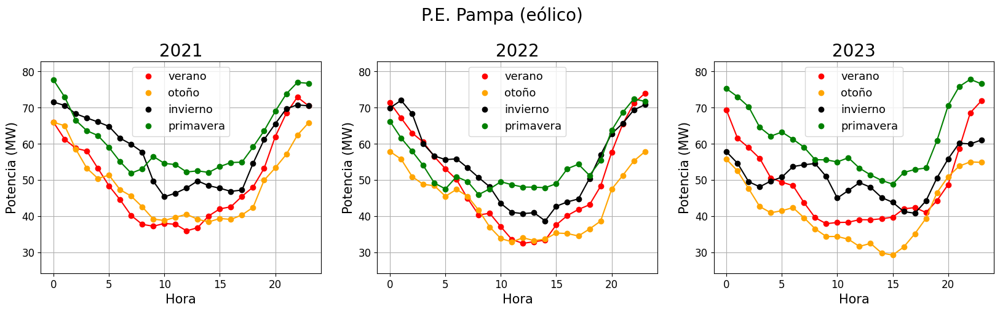

/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

0.0 39.15568888888889
Generación promedio por año, estación y hora para el generador solar El Naranjal


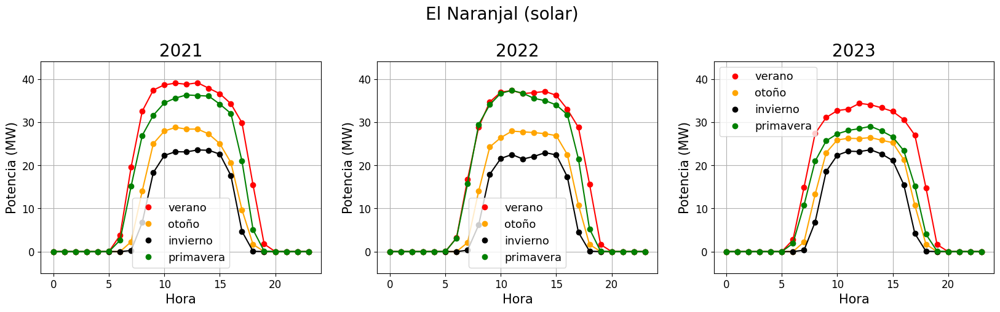

/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

65.12122222222222 786.0679347826089
Generación promedio por año, estación y hora para el generador hidráulico Salto Grande Uruguay


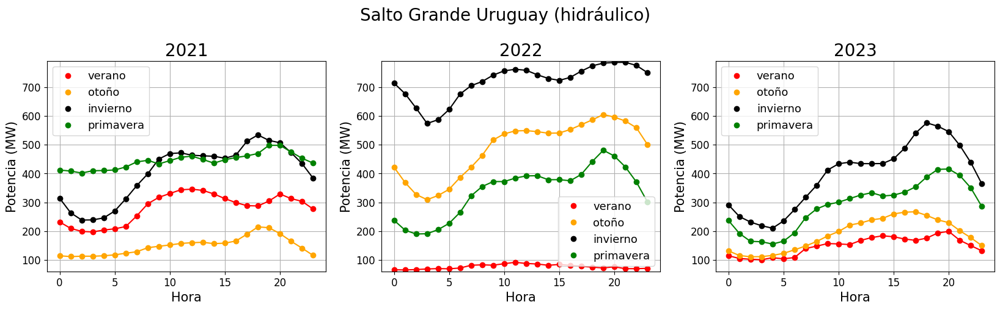

/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

0.0 83.90845384615383
Generación promedio por año, estación y hora para el generador biomasa Montes del Plata


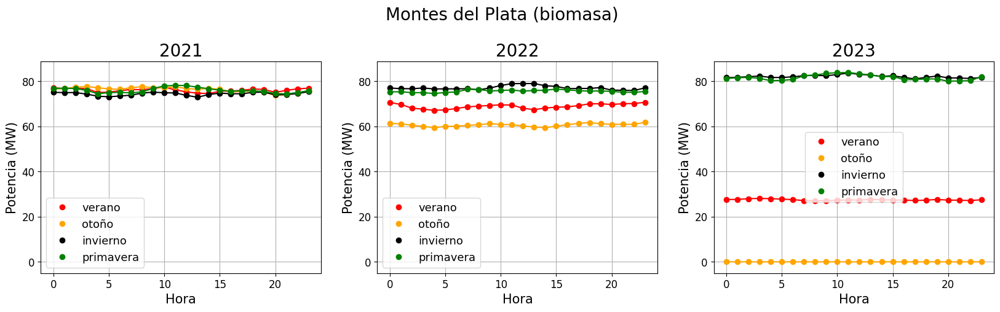

/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_686124/397809187.py:17: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81

0.0 179.95666666666665
Generación promedio por año, estación y hora para el generador térmico APR A


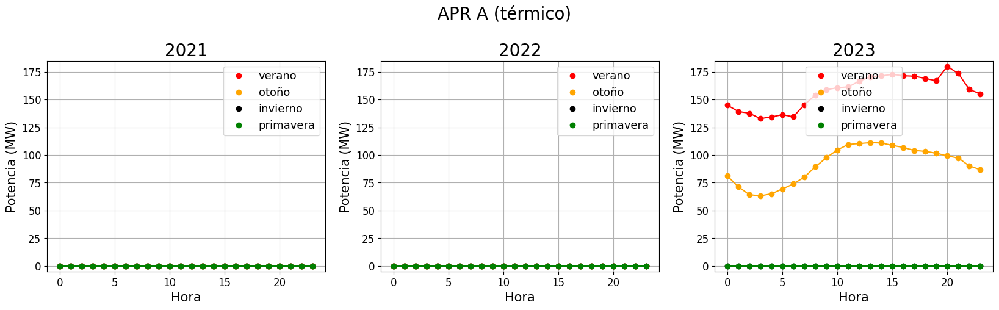

In [43]:
gens = ['Eólico.36', 'Solar.15', 'Hidráulico', 'Biomasa.5', 'Térmico.1']
for gen in gens:
    fig = plot_mean_var_per_hour(gen, ['red', 'orange', 'black', 'green'])
    fig.savefig(f'{gen_path}/imgs/gen_por_año_{gen.split('.')[0]}.pdf')

In [89]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

def plot_mean_var_per_hour(gens, colors, save_fig=None):
    gen_path = '/home/nacho/sup_uru/data/generacion'
    list_files = os.listdir(gen_path)
    años = ['2021', '2022', '2023']
    archivos_por_año = sorted(list_files[1:-1])[:2], sorted(list_files[1:-1])[2:4], sorted(list_files[1:-1])[4:-1]
    seasons = ['verano', 'otoño', 'invierno', 'primavera']
    
    # Crear subplots verticales con una fila para cada generador
    fig, axs = plt.subplots(len(gens), 3, figsize=(20, 5 * len(gens)), sharex=True)
    
    for idx, gen in enumerate(gens):
        año = {}
        for g, files in enumerate(archivos_por_año):
            gen_per_season = {season: [[] for _ in range(24)] for season in seasons}
            for i, file in enumerate(files):
                a = pd.read_csv(f'{gen_path}/{file}')
                first_row = a.iloc[0]
                first_column = a.iloc[:, 0]

                # Convertimos el resto del DataFrame a float (excepto la primera fila y columna)
                a.iloc[1:, 1:] = a.iloc[1:, 1:].astype(float)
                a.iloc[0] = first_row
                a.iloc[:, 0] = first_column
                if i % 2 == 0:
                    a = a.iloc[:-720]
                
                dates = a.iloc[1:, 0].tolist()
                indices = {
                    'verano': [i for i, date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [12, 1, 2]],
                    'invierno': [i for i, date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [6, 7, 8]],
                    'otoño': [i for i, date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [3, 4, 5]],
                    'primavera': [i for i, date in enumerate(dates) if int(date.split(' ')[0].split('-')[1]) in [9, 10, 11]]
                }
                
                for season in seasons:
                    for h in range(24):
                        gen_per_season[season][h] += [a.loc[j + 1, gen] for j in indices[season] if int(a.iloc[j + 1, 0].split(' ')[1].split(':')[0]) == h]
                año[años[g]] = gen_per_season
            
        max_val = max([np.mean(gen_per_season[season][h]) for gen_per_season in año.values() for season in seasons for h in range(24)])
        min_val = min([np.mean(gen_per_season[season][h]) for gen_per_season in año.values() for season in seasons for h in range(24)])
        
        for y, gen_per_season in enumerate(año.values()):
            for i, season in enumerate(seasons):
                means = []
                for h in range(24):
                    mean = np.mean(gen_per_season[season][h])
                    # var = np.std(gen_per_season[season][h])
                    means.append(mean)
                    if h == 0:
                        axs[idx, y].plot(h, mean, 'o', color=colors[i], label=season)
                    else:
                        axs[idx, y].plot(h, mean, 'o', color=colors[i])
                axs[idx, y].plot(np.arange(24), means, '-', color=colors[i])
            axs[idx, y].set_title(años[y], fontsize=20)
            axs[idx, y].set_ylabel('Potencia (MW)', fontsize=20)
            axs[idx, y].set_xlabel('Hora', fontsize=20)
            axs[idx, y].set_axisbelow(True)
            axs[idx, y].grid()
            axs[idx, y].legend(fontsize=13)
            axs[idx, y].set_ylim(min_val - 5, max_val + 5)
            axs[idx, y].tick_params(axis='both', which='major', labelsize=15)
            axs[idx, y].xaxis.set_tick_params(labelbottom=True)
        
        # Añadir el texto del generador arriba de cada fila de subplots
        # print(1 - (idx + 1) / len(gens) + 0.05 / len(gens))
        # fig.text(0.5,  1 - (idx + 1) / len(gens) + 0.05 / len(gens), f'{a.loc[:, gen].iloc[0]} (MW)', ha='center', fontsize=20, weight='bold')
    
    plt.subplots_adjust(hspace=0.6, top=0.9)  # Adjust vertical space between subplots
    
    plt.show()
    
    return fig


/tmp/ipykernel_3515/2218024358.py:21: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159) have mixed types. Specify dtype option on import or set low_memory=False.
  a = pd.read_csv(f'{gen_path}/{file}')
/tmp/ipykernel_3515/2218024358.py:21: DtypeWarning: Columns (1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,8

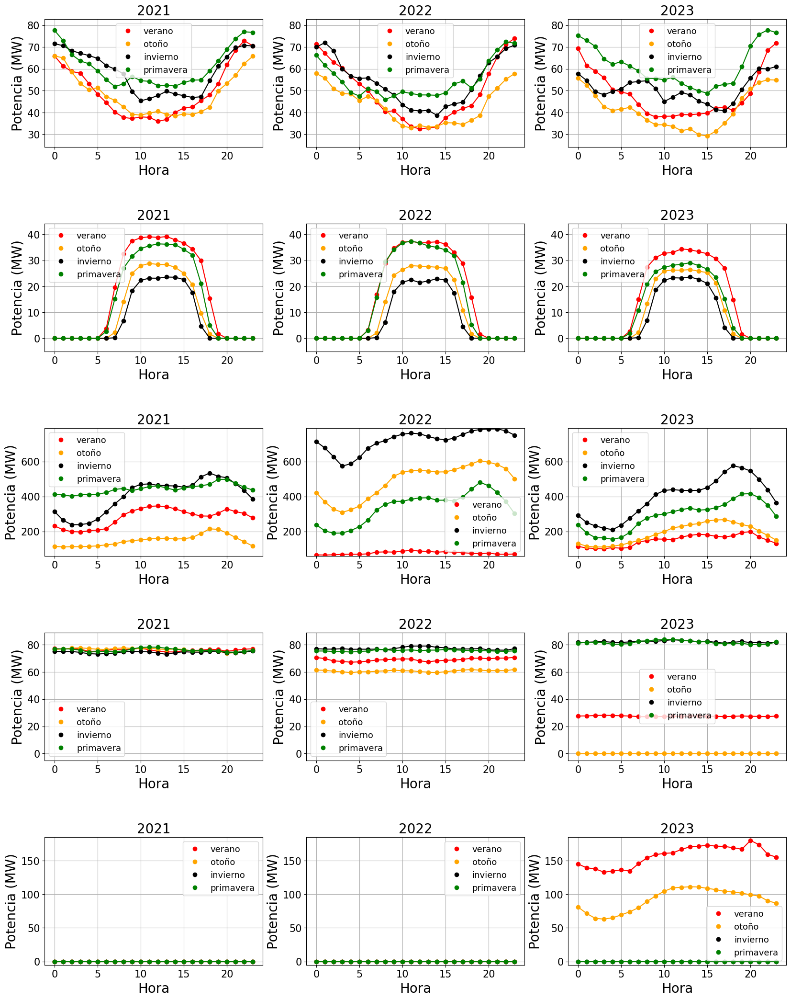

In [90]:
gens = ['Eólico.36', 'Solar.15', 'Hidráulico', 'Biomasa.5', 'Térmico.1']
fig = plot_mean_var_per_hour(gens, ['red', 'orange', 'black', 'green'])
fig.savefig('/home/nacho/sup_uru/data/generacion/imgs/'+'gen_por_año.pdf')


## Promedio de train val y test

In [4]:
train = f'./reduru_finalll_secuencial/train/input.npy'
val = f'./reduru_finalll_secuencial/val/input.npy'
test = f'./reduru_finalll_secuencial/test/input.npy'

train = np.load(train)
val = np.load(val)
test = np.load(test)

In [14]:
train_load_p, train_load_q, train_gen_p, train_sgen_p = train[:, :, 0], train[:, :, 1], train[:, :, 2], train[:, :, 3]
val_load_p, val_load_q, val_gen_p, val_sgen_p = val[:, :, 0], val[:, :, 1], val[:, :, 2], val[:, :, 3]
test_load_p, test_load_q, test_gen_p, test_sgen_p = test[:, :, 0], test[:, :, 1], test[:, :, 2], test[:, :, 3]

# mean for each feature
print('mean train load_p:', np.mean(train_load_p))
print('mean train load_q:', np.mean(train_load_q))
print('mean train gen_p:', np.mean(train_gen_p)+np.mean(train_sgen_p))
print('---------------------------')
print('mean val load_p:', np.mean(val_load_p))
print('mean val load_q:', np.mean(val_load_q))
print('mean val gen_p:', np.mean(val_gen_p) + np.mean(val_sgen_p))
print('---------------------------')
print('mean test load_p:', np.mean(test_load_p))
print('mean test load_q:', np.mean(test_load_q))
print('mean test gen_p:', np.mean(test_gen_p) + np.mean(test_sgen_p))



mean train load_p: 12.617840364878248
mean train load_q: 2.2787657032671804
mean train gen_p: 10.295728044825793
---------------------------
mean val load_p: 10.09207002931269
mean val load_q: 1.8300630043258352
mean val gen_p: 7.426717998802404
---------------------------
mean test load_p: 11.339967488069023
mean test load_q: 2.0686598909514986
mean test gen_p: 8.611602365540564


In [15]:
train = f'./reduru_sintetica/train/input.npy'
val = f'./reduru_sintetica/val/input.npy'
test = f'./reduru_sintetica/test/input.npy'

train = np.load(train)
val = np.load(val)
test = np.load(test)

In [16]:
train_load_p, train_load_q, train_gen_p, train_sgen_p = train[:, :, 0], train[:, :, 1], train[:, :, 2], train[:, :, 3]
val_load_p, val_load_q, val_gen_p, val_sgen_p = val[:, :, 0], val[:, :, 1], val[:, :, 2], val[:, :, 3]
test_load_p, test_load_q, test_gen_p, test_sgen_p = test[:, :, 0], test[:, :, 1], test[:, :, 2], test[:, :, 3]

# mean for each feature
print('mean train load_p:', np.mean(train_load_p))
print('mean train load_q:', np.mean(train_load_q))
print('mean train gen_p:', np.mean(train_gen_p)+np.mean(train_sgen_p))
print('---------------------------')
print('mean val load_p:', np.mean(val_load_p))
print('mean val load_q:', np.mean(val_load_q))
print('mean val gen_p:', np.mean(val_gen_p) + np.mean(val_sgen_p))
print('---------------------------')
print('mean test load_p:', np.mean(test_load_p))
print('mean test load_q:', np.mean(test_load_q))
print('mean test gen_p:', np.mean(test_gen_p) + np.mean(test_sgen_p))



mean train load_p: 12.631673279011201
mean train load_q: 2.5669119350941707
mean train gen_p: 10.22858222881247
---------------------------
mean val load_p: 12.64177465938277
mean val load_q: 2.5598297138413746
mean val gen_p: 10.246943190833182
---------------------------
mean test load_p: 12.639483823347
mean test load_q: 2.5689724356614074
mean test gen_p: 10.246916361036837


## Pgen - Pload

In [2]:
gen_p = pd.read_csv("./crudo/GENP_total_pandapower.csv")
load_p = pd.read_csv("./crudo/LOADP_total_pandapower.csv")


In [18]:
gen = gen_p.iloc[:,1:].sum(axis=1)

In [19]:
load = load_p.iloc[:,1:].sum(axis=1)

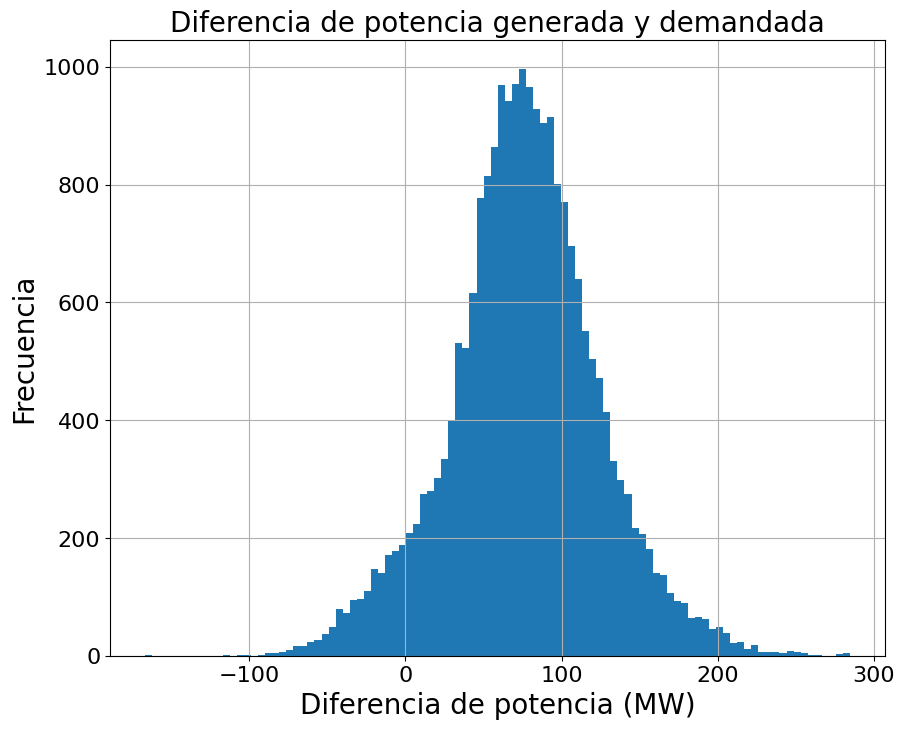

In [34]:
fig = plt.figure(figsize=(10, 8))
plt.hist(gen-load, bins=100);
plt.title('Diferencia de potencia generada y demandada', fontsize=20)
plt.xlabel('Diferencia de potencia (MW)', fontsize=20)
plt.ylabel('Frecuencia', fontsize=20)
#size of the ticks
plt.tick_params(axis='both', which='major', labelsize=16)  # Major ticks
plt.tick_params(axis='both', which='minor', labelsize=16)  # Minor ticks (if any)
plt.grid()
#save in pdf
fig.savefig('/home/nacho/sup_uru/data/'+'pot_gen_vs_cons.pdf')